In [2]:
import os
os.environ['MKL_SERVICE_FORCE_INTEL'] = '1'

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import pandas as pd
from pyemd import emd
from pathlib import Path

import warnings 
warnings.filterwarnings("ignore")

### EMD - Movement Class

In [3]:
class EMD_Movement:

    def __init__(self, path, normalization='median', bins=30):

        # Load the data
        data = pd.read_csv(path)
        tmp = list()
        for i, frame in data.groupby('frame'):
            tmp.append(frame)
        
        self.frames = tmp
        self.last_frame = len(self.frames) - 1

        # Set bins
        self.bins = bins

        # Extract the positions of the droplets in each frame
        self.positions = [np.array(frame[['center_x', 'center_y']].values, dtype=np.float64) for frame in self.frames]

        # Normalization of the droplet positions
        assert normalization in ['median', 'mean', 'None'], "Normalization must be either 'median' or 'mean' or 'none'"
        self.norm = normalization

        if self.norm == 'median':
            self.normalizer = data['radius'].median()

        elif self.norm == 'mean':
            self.normalizer = data['radius'].mean()

        else:
            self.normalizer = 1

        #  Normalize the positions by the median droplet radius
        for i in range(len(self.positions)):
            self.positions[i] /= self.normalizer

        self.emd_distances = None

    def emd_distance(self, source, target):
        # Compute the Earth Mover's Distance between two 2D point clouds

        # Get the maximum x and y coordinates
        self.x_max = max(np.max(source[:, 0]), np.max(target[:, 0]))
        self.y_max = max(np.max(source[:, 1]), np.max(target[:, 1]))

        # Convert 2D arrays to histograms (example using simple binning)
        hist1, xedges, yedges = np.histogram2d(source[:, 0], source[:, 1], bins=self.bins, range=[[0, self.x_max], [0, self.y_max]])
        hist2, _, _ = np.histogram2d(target[:, 0], target[:, 1], bins=self.bins, range=[[0, self.x_max], [0, self.y_max]])

        # Normalize histograms to create probability distributions
        self.hist1 = hist1 / np.sum(hist1)
        self.hist2 = hist2 / np.sum(hist2)

        # Flatten histograms to 1D arrays
        hist1_flat = self.hist1.flatten()
        hist2_flat = self.hist2.flatten()

        # Create a distance matrix using Euclidean distance
        bin_centers = np.array([(x, y) for x in (xedges[:-1] + xedges[1:]) / 2 for y in (yedges[:-1] + yedges[1:]) / 2])

        # Reshape bin_centers for broadcasting
        bin_centers_x = bin_centers[:, 0].reshape(-1, 1)
        bin_centers_y = bin_centers[:, 1].reshape(-1, 1)

        # Compute the squared differences in a vectorized manner
        diff_x = bin_centers_x - bin_centers_x.T
        diff_y = bin_centers_y - bin_centers_y.T

        # Compute the distance matrix
        distance_matrix = np.sqrt(diff_x ** 2 + diff_y ** 2)

        # Calculate the Earth Mover's Distance
        emd_dist = emd(hist1_flat, hist2_flat, distance_matrix)

        return emd_dist
    
    def emd_(self, first_frame=0, last_frame=None, print_=True):

        if last_frame is None:
            last_frame = self.last_frame
                
        self.emd_distances = list()
        for i in range(first_frame, last_frame):
            source = self.positions[i]
            target = self.positions[i+1]
            self.emd_distances.append(self.emd_distance(source, target))

        self.emd_distances = np.array(self.emd_distances)

        if print_:
            print(f"Earth Mover's Distance with {self.bins} bins:")
            print(f"Mean: {np.mean(self.emd_distances):.3f} (std: {np.std(self.emd_distances):.3f})")
            print(f"Median: {np.median(self.emd_distances):.3f}")
            print()

        return self.emd_distances
    
    def plot_emd(self, source_frame=0, target_frame=1):
        assert 0 <= source_frame < len(self.frames), f"source_frame must be in the range [0, {len(self.frames) - 1}]"
        assert 0 <= target_frame < len(self.frames), f"target_frame must be in the range [0, {len(self.frames) - 1}]"
        assert source_frame != target_frame, "source_frame and target_frame must be different"
        assert source_frame < target_frame, "source_frame must be less than target_frame"

        source = self.positions[source_frame]
        target = self.positions[target_frame]
    
        emd_ = self.emd_distance(source, target)

        source = source * self.normalizer
        target = target * self.normalizer

        max_x = max(np.max(source[:, 0]), np.max(target[:, 0]))
        max_y = max(np.max(source[:, 1]), np.max(target[:, 1]))
        # Plot the Droplets
        fig = plt.figure(figsize=(16, 8))
        gs = GridSpec(2, 4, figure=fig, height_ratios=[1, 1], width_ratios=[1, 1, 1, 1])

        # Plot the both frames in one scatter plot
        ax1 = fig.add_subplot(gs[0:2, 0:2])
        ax1.set_title(f'Droplets in Source and Target frames with EMD: {emd_:.4f}', fontsize=16)
        ax1.scatter(source[:, 0], source[:, 1], alpha=0.6, c='blue', label=f'Source', s=10)
        ax1.scatter(target[:, 0], target[:, 1], alpha=0.6, c='red', label=f'Target)', s=10)
        ax1.set_xlim([0, max_x])
        ax1.set_ylim([0, max_y])
        ax1.invert_yaxis()  # Invert y-axis to make (0, 0) the top-left corner
        ax1.legend(loc='upper right')

        # Plot the histogram of the source frame
        ax2 = fig.add_subplot(gs[0, 2])
        ax2.set_title(f'2D-Histogram of Source frame', fontsize=16)
        ax2.hist2d(source[:, 0], source[:, 1], bins=self.bins, cmap='Blues')
        ax2.invert_yaxis()

        # Plot the histogram of the target frame
        ax3 = fig.add_subplot(gs[1, 2])
        ax3.set_title(f'2D-Histogram of Target frame', fontsize=16)
        ax3.hist2d(target[:, 0], target[:, 1], bins=self.bins, cmap='Reds')
        ax3.invert_yaxis()

        # Plot source frame scatter plot
        ax4 = fig.add_subplot(gs[0, 3])
        ax4.set_title(f'Droplets in Source frame', fontsize=16)
        ax4.scatter(source[:, 0], source[:, 1], alpha=0.6, c='blue', s=2)
        ax4.set_xlim([0, max_x])
        ax4.set_ylim([0, max_y])
        ax4.invert_yaxis()

        # Plot target frame scatter plot
        ax5 = fig.add_subplot(gs[1, 3])
        ax5.set_title(f'Droplets in Target frame', fontsize=16)
        ax5.scatter(target[:, 0], target[:, 1], alpha=0.6, c='red', s=2)
        ax5.set_xlim([0, max_x])
        ax5.set_ylim([0, max_y])
        ax5.invert_yaxis()

        plt.tight_layout()
        plt.show()

    def plot_positions(self):
        # Number of scatter plots
        num_plots = len(self.positions)

        # Determine the number of rows and columns
        cols = 4
        rows = (num_plots + cols - 1) // cols  # Ceiling division to get the number of rows

        fig, axes = plt.subplots(rows, cols, figsize=(15, 4 * rows), sharex=True, sharey=True)

        # Flatten the axes array for easy iteration
        axes = axes.flatten()

        for i in range(num_plots):
            axes[i].scatter(self.positions[i][:, 0]*self.normalizer, self.positions[i][:, 1]*self.normalizer, s=3)
            axes[i].set_title(f'Frame {i}')
            axes[i].set_xlim([0, np.max(self.positions[i][:, 0]*self.normalizer)])
            axes[i].set_ylim([0, np.max(self.positions[i][:, 1]*self.normalizer)])
            axes[i].invert_yaxis()

        # Hide any unused subplots
        for j in range(num_plots, len(axes)):
            axes[j].invert_yaxis()
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

### Get all RESULTS

In [4]:
def all_plot(MVT, clip):

    # EMD
    dist_emd = MVT.emd_()

    # Calculate the correlation between the output-stats and hausdorff and emd distances
    full = Path(Path('data/05_results') / Path(clip) / 'mvt_unfiltered_trajectories_y0_x0.csv')
    df = pd.read_csv(full, index_col=0)

    # drop unnecessary rows and columns
    df.drop(index=['mad','max','min','q20', 'q80', 'p_moved_1r', 'p_moved_5r'], inplace=True)
    df.drop(columns=['all_mean', 'all_std'], inplace=True)

    # EMD
    correlation_emd = list()
    for i in range(df.shape[0]):
        correlation_emd.append(np.corrcoef(df.iloc[i], dist_emd)[1,0])

    # Plot the correlation between the output-stats and hausdorff and emd distances
    fig = plt.figure(figsize=(18, 5)) 
    gs = GridSpec(1, 3, figure=fig, width_ratios=[1, 1, 1])

    # Plot the both frames in one scatter plot
    ax1 = fig.add_subplot(gs[0:2])
    ax1.set_title('Earth Mover\'s Distance')
    ax1.plot(range(1, len(dist_emd)+1), dist_emd, label='Earth Mover\'s Distance', color='blue')
    ax1.set_title('Earth Mover\'s Distance')
    ax1.set_xlabel('Step')
    ax1.grid(True)

    index = df.index.to_list()
    ax2 = fig.add_subplot(gs[2])
    ax2.bar(index, correlation_emd)
    ax2.set_title('Correlation between the output stats and the EMD distance')
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # Paper plot - plot the EMD distance and the median as a line
    fig = plt.figure(figsize=(18, 5))
    ax = fig.add_subplot(111)
    ax.plot(range(1, len(dist_emd)+1), dist_emd, label='EMD Distance', color='blue')
    ax.axhline(y=np.median(dist_emd), color='red', linestyle='--', label='Median')
    ax.set_title(f'EMD Distance with Median of {np.median(dist_emd):.3f}')

    ax.set_xlabel('Step')
    ax.grid(True)
    ax.legend()
    plt.show()

    return dist_emd

## Test Cases

### Small

#### MVT 1

Earth Mover's Distance with 30 bins:
Mean: 0.495 (std: 0.465)
Median: 0.160

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


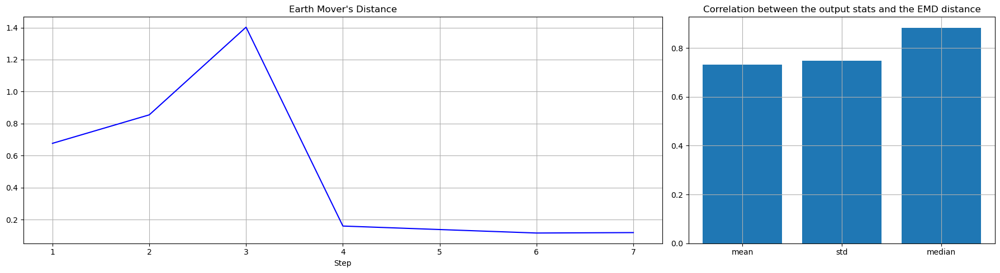

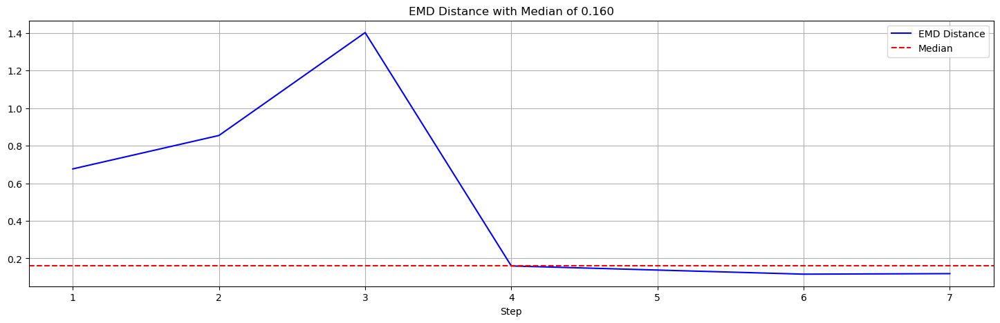

In [5]:
clip = 'small_mvt_1'
EMD_small_mvt_1 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

small_mvt_1_emd = all_plot(EMD_small_mvt_1, clip)

#### MVT 2

Earth Mover's Distance with 30 bins:
Mean: 0.760 (std: 1.010)
Median: 0.310

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


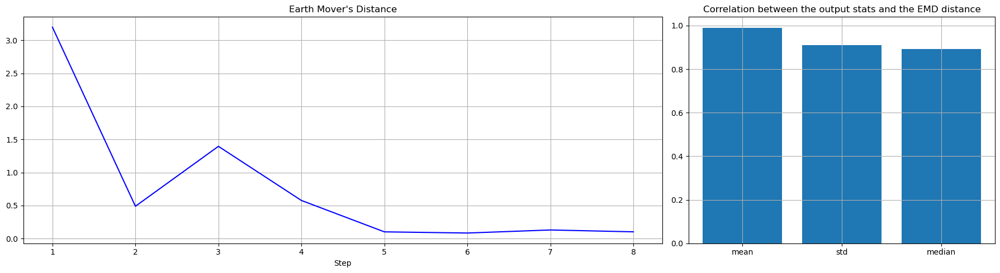

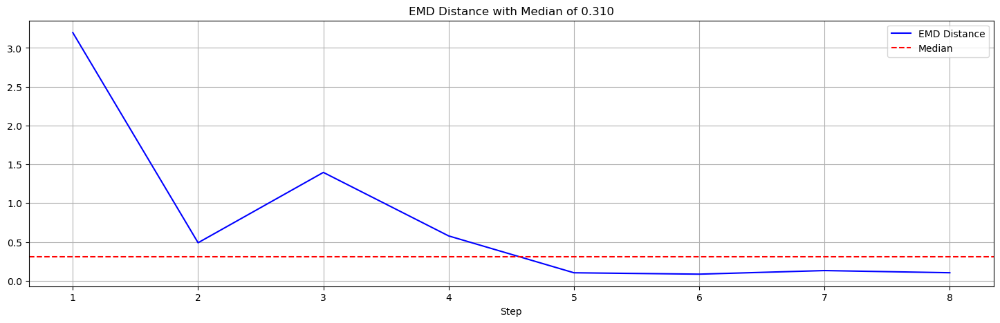

In [6]:
clip = 'small_mvt_2'
EMD_small_mvt_2 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

small_mvt_2_emd = all_plot(EMD_small_mvt_2, clip)

#### MVT 3

Earth Mover's Distance with 30 bins:
Mean: 2.095 (std: 3.354)
Median: 0.147

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


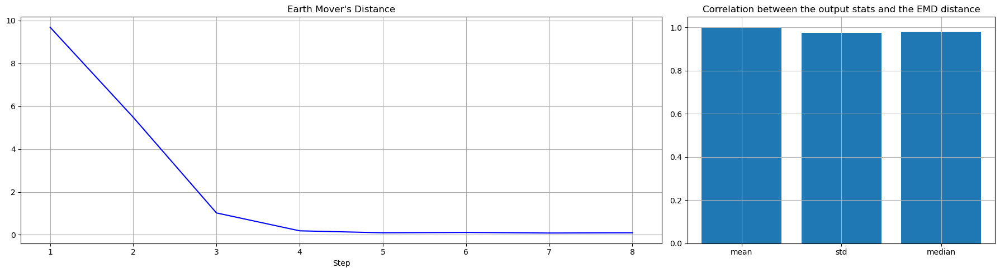

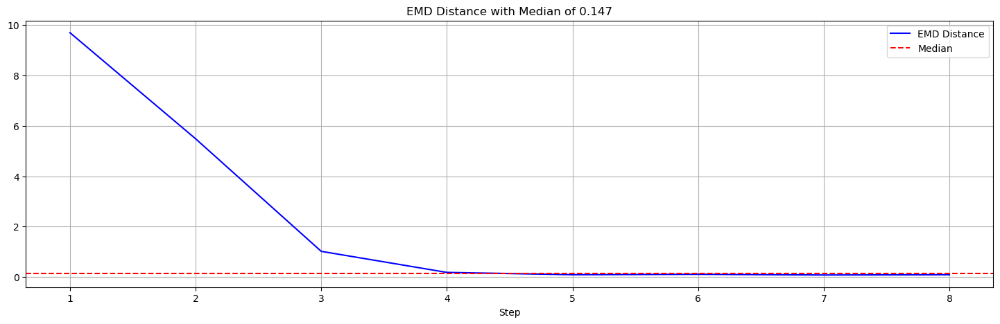

In [7]:
clip = 'small_mvt_3'
EMD_small_mvt_3 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

small_mvt_3_emd = all_plot(EMD_small_mvt_3, clip)

### Large

#### MVT 1

Earth Mover's Distance with 30 bins:
Mean: 2.179 (std: 1.473)
Median: 2.153

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


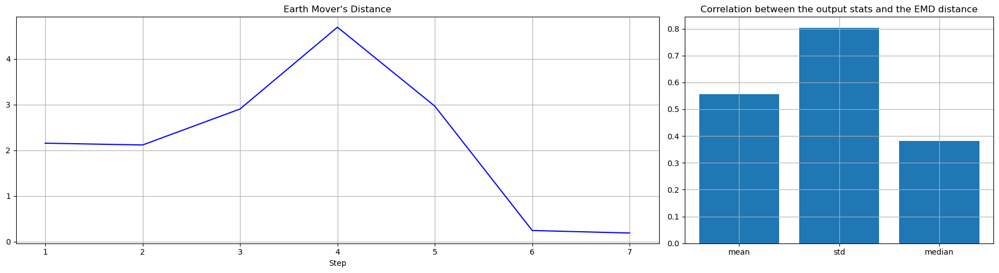

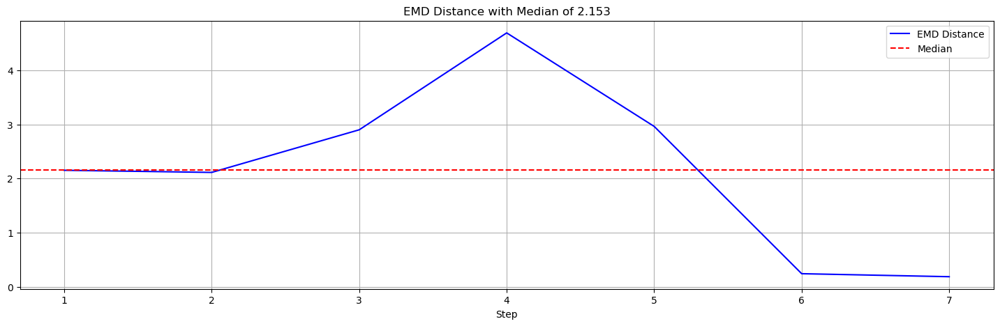

In [8]:
clip = 'large_mvt_1'
EMD_large_mvt_1 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

large_mvt_1_emd = all_plot(EMD_large_mvt_1, clip)

#### MVT 2

Earth Mover's Distance with 30 bins:
Mean: 1.248 (std: 0.269)
Median: 1.317

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


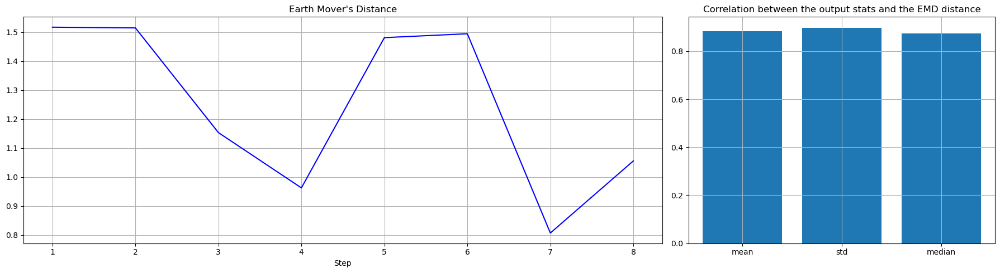

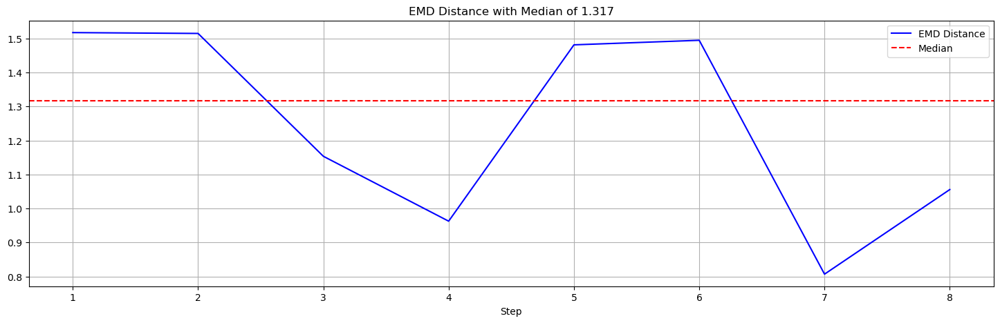

In [9]:
clip = 'large_mvt_2'
EMD_large_mvt_2 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

large_mvt_2_emd = all_plot(EMD_large_mvt_2, clip)

#### MVT 3

Earth Mover's Distance with 30 bins:
Mean: 0.923 (std: 0.897)
Median: 0.444

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


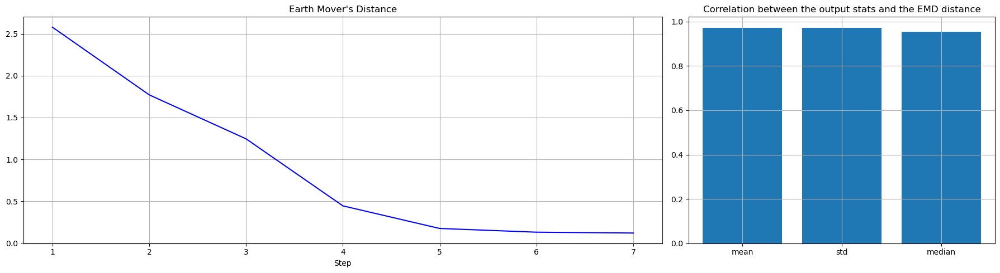

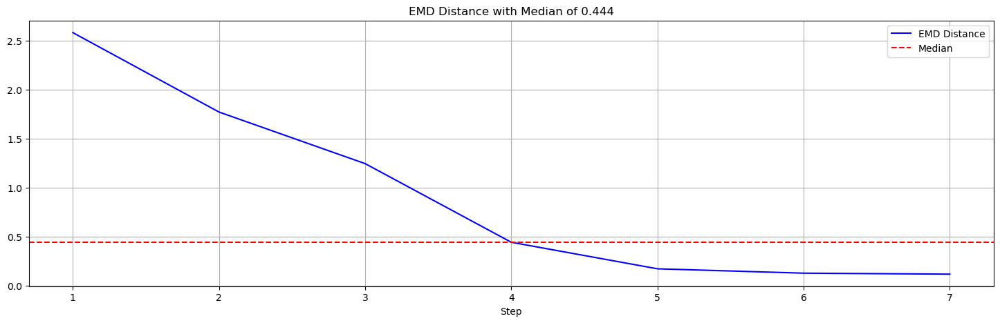

In [10]:
clip = 'large_mvt_3'
EMD_large_mvt_3 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

large_mvt_3_emd = all_plot(EMD_large_mvt_3, clip)

#### MVT 4

Earth Mover's Distance with 30 bins:
Mean: 1.179 (std: 0.233)
Median: 1.238

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


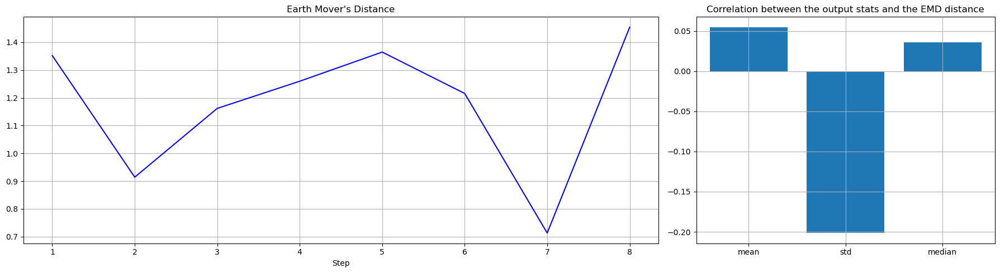

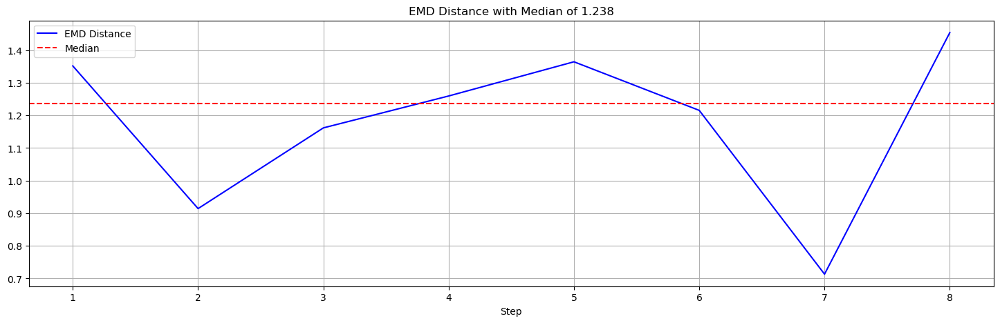

In [11]:
clip = 'large_mvt_4'
EMD_large_mvt_4 = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

large_mvt_4_emd = all_plot(EMD_large_mvt_4, clip)

### Bar Plot

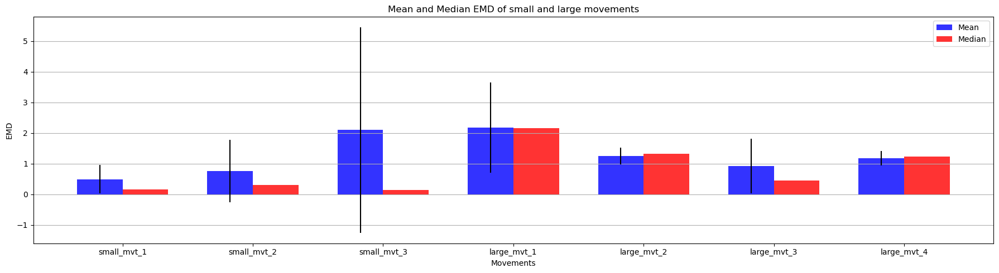

In [12]:
mean_emd = [np.mean(small_mvt_1_emd), np.mean(small_mvt_2_emd), np.mean(small_mvt_3_emd), 
            np.mean(large_mvt_1_emd), np.mean(large_mvt_2_emd), np.mean(large_mvt_3_emd),  np.mean(large_mvt_4_emd)]

std_emd = [np.std(small_mvt_1_emd), np.std(small_mvt_2_emd), np.std(small_mvt_3_emd),
            np.std(large_mvt_1_emd), np.std(large_mvt_2_emd), np.std(large_mvt_3_emd), np.std(large_mvt_4_emd)]

median_emd = [np.median(small_mvt_1_emd), np.median(small_mvt_2_emd), np.median(small_mvt_3_emd),
            np.median(large_mvt_1_emd), np.median(large_mvt_2_emd), np.median(large_mvt_3_emd), np.median(large_mvt_4_emd)]

# bar plot of the mean and the median of EMD of small and large movements next to each other
fig, ax = plt.subplots(figsize=(18, 5))
index = np.arange(7)
bar_width = 0.35
opacity = 0.8

rects1 = ax.bar(index, mean_emd, bar_width, yerr=std_emd, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median_emd, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Movements')
ax.set_ylabel('EMD')
ax.set_title('Mean and Median EMD of small and large movements')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('small_mvt_1', 'small_mvt_2', 'small_mvt_3', 'large_mvt_1', 'large_mvt_2', 'large_mvt_3', 'large_mvt_4'))
ax.yaxis.grid(True)
ax.legend()

plt.tight_layout()
plt.show()

## SmallMov_Sparse

#### Full

Earth Mover's Distance with 30 bins:
Mean: 0.605 (std: 0.250)
Median: 0.582

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


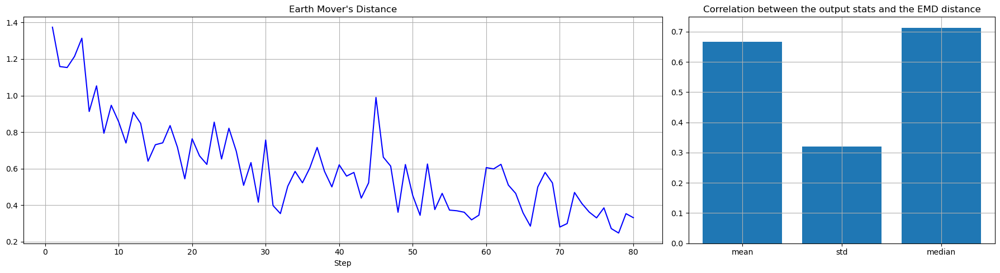

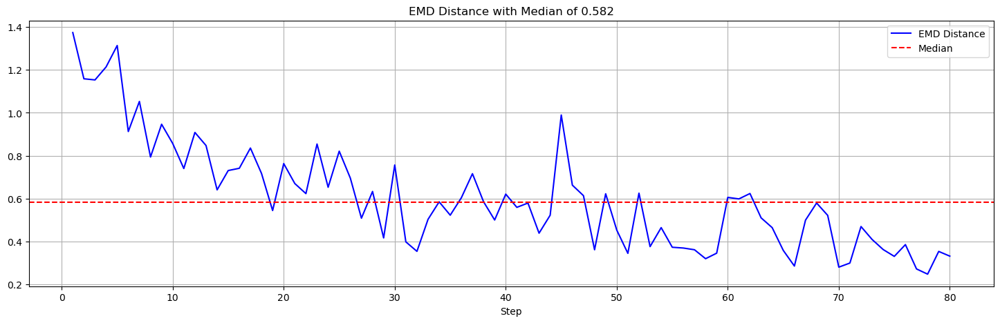

In [13]:
clip = 'SmallMov_Sparse'
EMD_SmallMov_Sparse = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

SmallMov_Sparse_emd = all_plot(EMD_SmallMov_Sparse, clip)

#### 5 min

Earth Mover's Distance with 30 bins:
Mean: 1.411 (std: 0.581)
Median: 1.298

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


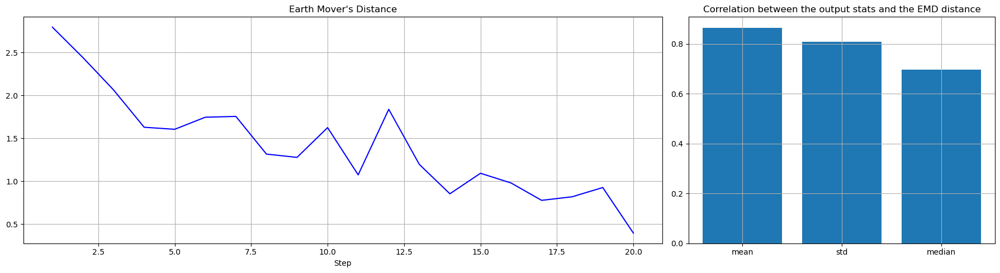

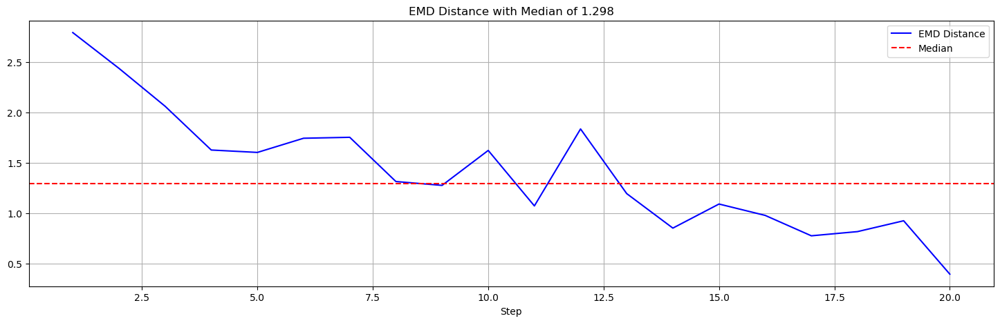

In [14]:
clip = 'SmallMov_Sparse_05min'
EMD_SmallMov_Sparse_05min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

SmallMov_Sparse_05min_emd = all_plot(EMD_SmallMov_Sparse_05min, clip)

#### 15 min

Earth Mover's Distance with 30 bins:
Mean: 3.182 (std: 1.198)
Median: 3.314

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


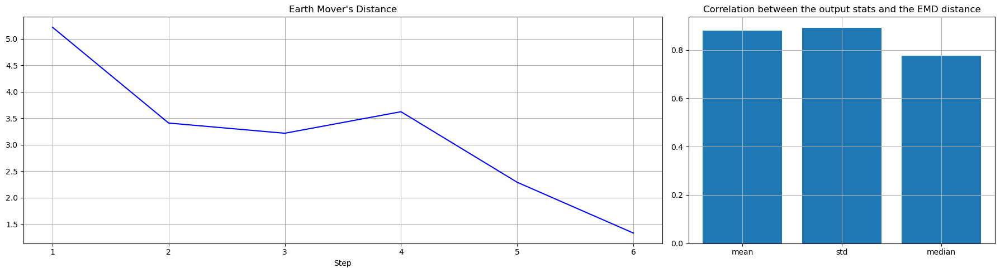

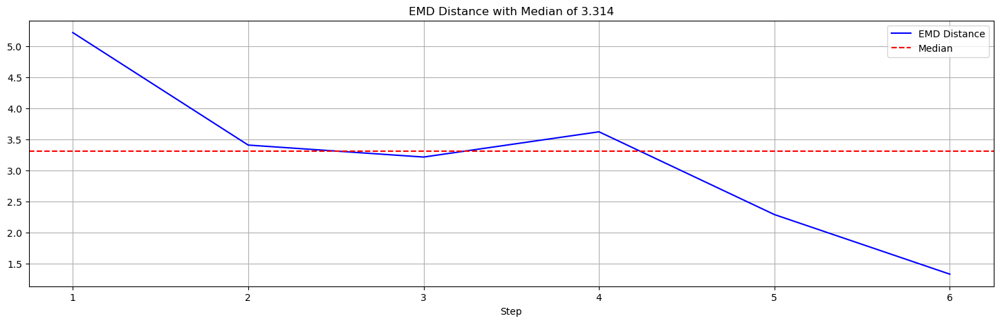

In [15]:
clip = 'SmallMov_Sparse_15min'
EMD_SmallMov_Sparse_15min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

SmallMov_Sparse_15min_emd = all_plot(EMD_SmallMov_Sparse_15min, clip)

#### 30 min

Earth Mover's Distance with 30 bins:
Mean: 5.418 (std: 1.895)
Median: 6.294

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


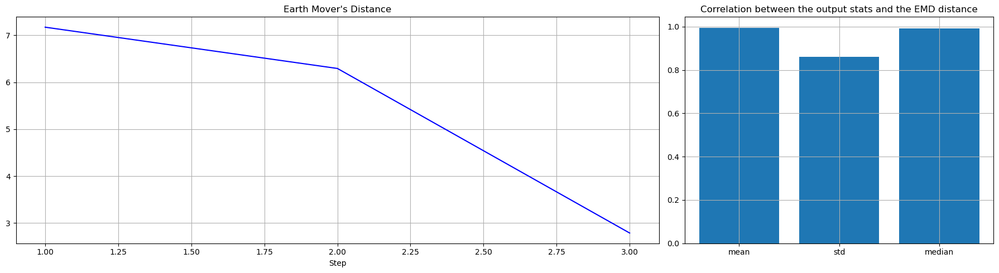

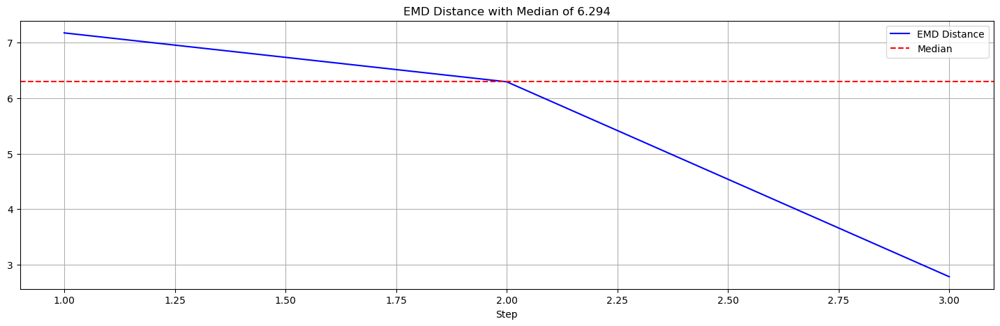

In [16]:
clip = 'SmallMov_Sparse_30min'
EMD_SmallMov_Sparse_30min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

SmallMov_Sparse_30min_emd = all_plot(EMD_SmallMov_Sparse_30min, clip)

#### All TLs

Earth Mover's Distance of SmallMov_Sparse:
Mean: 0.605 (std: 0.250)
Median: 0.582

Earth Mover's Distance of SmallMov_Sparse_05min:
Mean: 1.411 (std: 0.581)
Median: 1.298

Earth Mover's Distance of SmallMov_Sparse_15min:
Mean: 3.182 (std: 1.198)
Median: 3.314

Earth Mover's Distance of SmallMov_Sparse_30min:
Mean: 5.418 (std: 1.895)
Median: 6.294



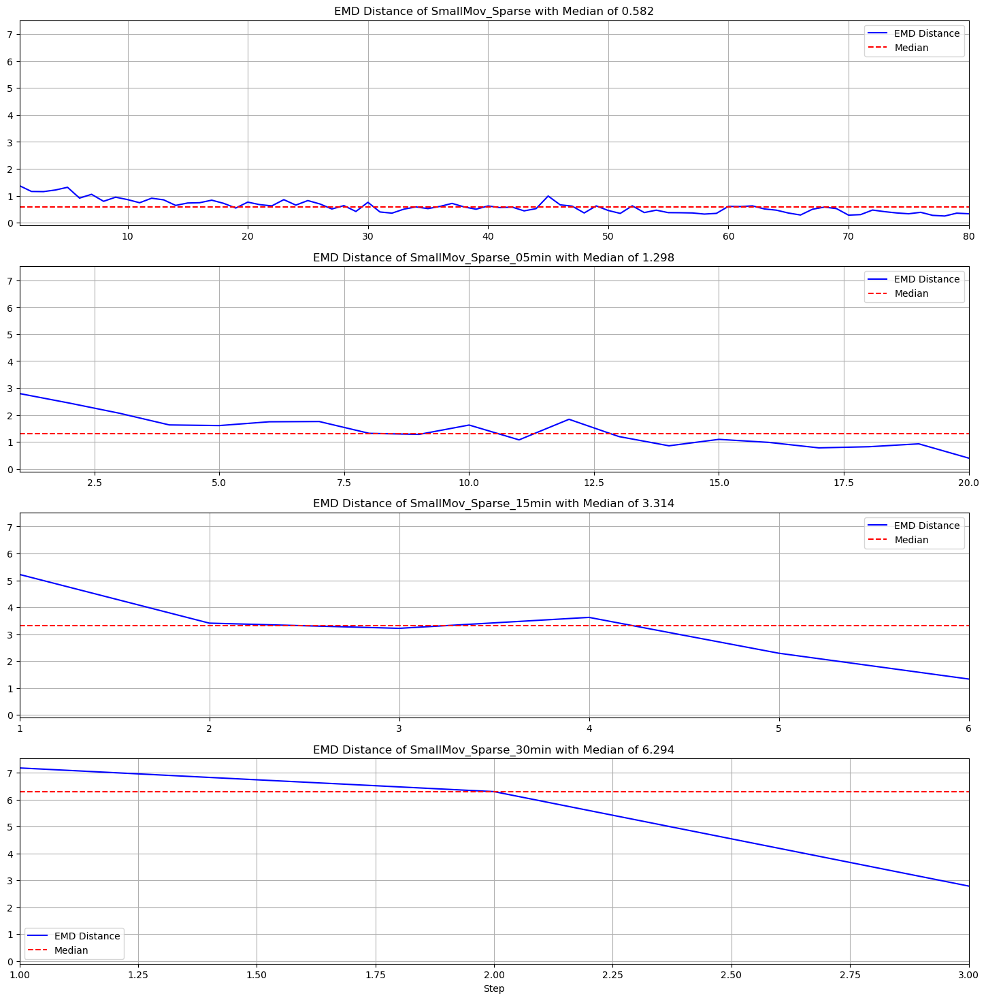

In [49]:
fig, ax = plt.subplots(4, 1, figsize=(18, 18), sharey=True)

for i, (x, title) in enumerate(zip([SmallMov_Sparse_emd, SmallMov_Sparse_05min_emd, SmallMov_Sparse_15min_emd, SmallMov_Sparse_30min_emd],
                          ['SmallMov_Sparse', 'SmallMov_Sparse_05min', 'SmallMov_Sparse_15min', 'SmallMov_Sparse_30min'])):
    
    print(f"Earth Mover's Distance of {title}:")
    print(f"Mean: {np.mean(x):.3f} (std: {np.std(x):.3f})")
    print(f"Median: {np.median(x):.3f}")
    print()

    ax[i].plot(range(1, len(x)+1), x, label='EMD Distance', color='blue')
    ax[i].axhline(y=np.median(x), color='red', linestyle='--', label='Median')
    ax[i].set_title(f'EMD Distance of {title} with Median of {np.median(x):.3f}')
    ax[i].set_xlim([1, len(x)])
    ax[i].grid(True)
    ax[i].legend()

ax[3].set_xlabel('Step')
plt.show()

#### Bar Plot

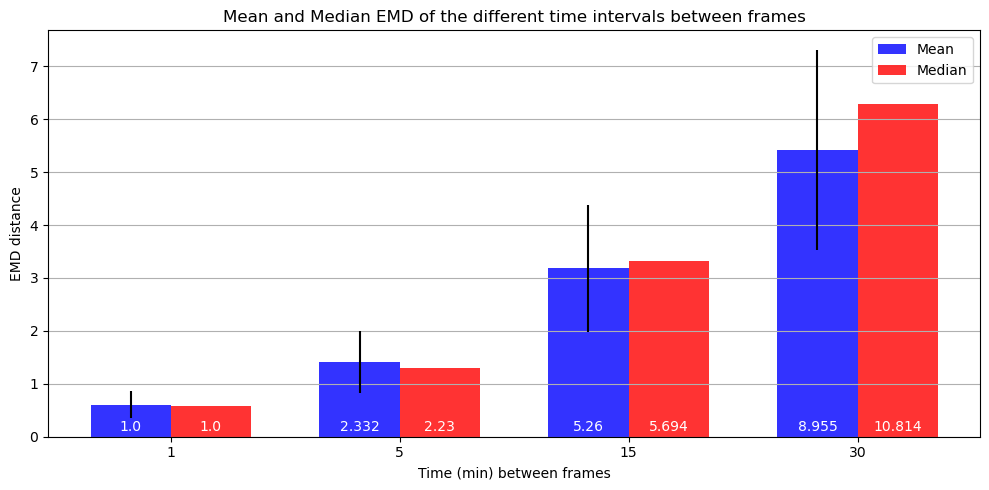

In [17]:
mean_emd_SmallMov_Sparse = [np.mean(SmallMov_Sparse_emd), np.mean(SmallMov_Sparse_05min_emd), np.mean(SmallMov_Sparse_15min_emd), np.mean(SmallMov_Sparse_30min_emd)]
std_emd_SmallMov_Sparse = [np.std(SmallMov_Sparse_emd), np.std(SmallMov_Sparse_05min_emd), np.std(SmallMov_Sparse_15min_emd), np.std(SmallMov_Sparse_30min_emd)]
median_emd_SmallMov_Sparse = [np.median(SmallMov_Sparse_emd), np.median(SmallMov_Sparse_05min_emd), np.median(SmallMov_Sparse_15min_emd), np.median(SmallMov_Sparse_30min_emd)]

mean_emd_SmallMov_Sparse = [round(x, 3) for x in mean_emd_SmallMov_Sparse]
std_emd_SmallMov_Sparse = [round(x, 3) for x in std_emd_SmallMov_Sparse]
median_emd_SmallMov_Sparse = [round(x, 3) for x in median_emd_SmallMov_Sparse]

fig, ax = plt.subplots(figsize=(10, 5))
index = np.arange(4)
bar_width = 0.35
opacity = 0.8

rects1 = ax.bar(index, mean_emd_SmallMov_Sparse, bar_width, yerr=std_emd_SmallMov_Sparse, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median_emd_SmallMov_Sparse, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Time (min) between frames')
ax.set_ylabel('EMD distance')
ax.set_title('Mean and Median EMD of the different time intervals between frames')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('1', '5', '15', '30'))
ax.yaxis.grid(True)
ax.legend()

# plot the relative mean EMD distances relative to the 1 min time interval into the same plot
rel_mean_emd_SmallMov_Sparse = [round(x/mean_emd_SmallMov_Sparse[0], 3) for x in mean_emd_SmallMov_Sparse]
rel_median_emd_SmallMov_Sparse = [round(x/median_emd_SmallMov_Sparse[0], 3) for x in median_emd_SmallMov_Sparse]

# Add numbers on top of each bar
for i, value in enumerate(rel_mean_emd_SmallMov_Sparse):
    ax.text(i, 0.1, str(value), ha='center', color='white')

for i, value in enumerate(rel_median_emd_SmallMov_Sparse):
    ax.text(i+bar_width, 0.1, str(value), ha='center', color='white')

plt.tight_layout()
plt.show()

## MedMov_SparseLargeDrops

#### Full

Earth Mover's Distance with 30 bins:
Mean: 0.406 (std: 0.100)
Median: 0.393

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


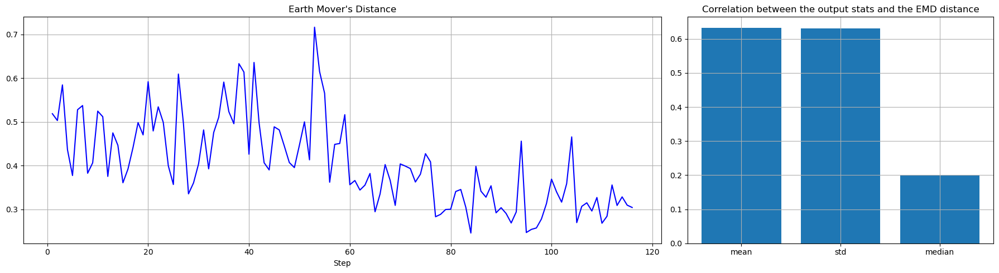

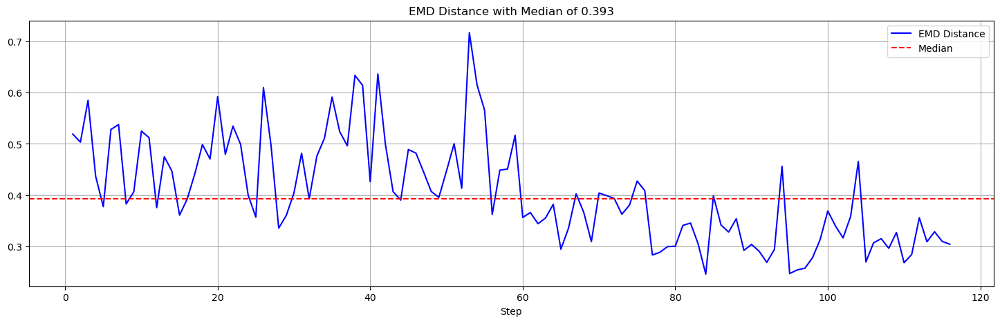

In [18]:
clip = 'MedMov_SparseLargeDrops'
EMD_MedMov_SparseLargeDrops = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_SparseLargeDrops_emd = all_plot(EMD_MedMov_SparseLargeDrops, clip)

#### 5 min

Earth Mover's Distance with 30 bins:
Mean: 0.411 (std: 0.112)
Median: 0.377

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


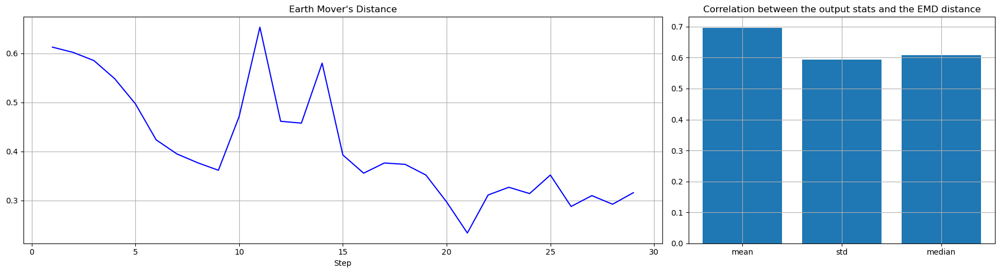

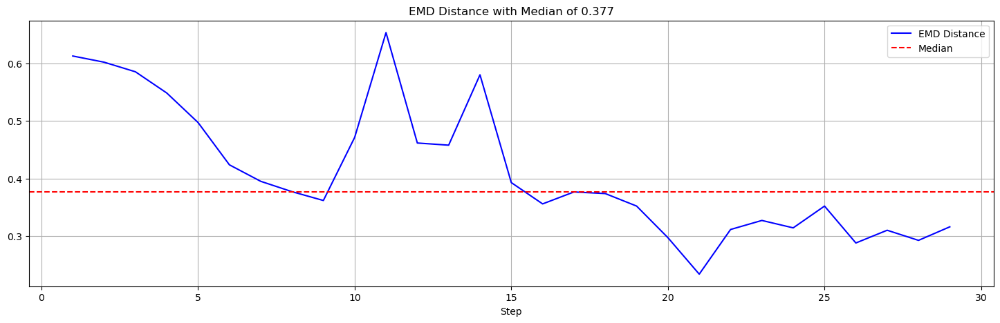

In [19]:
clip = 'MedMov_SparseLargeDrops_05min'
EMD_MedMov_SparseLargeDrops_05min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_SparseLargeDrops_05min_emd = all_plot(EMD_MedMov_SparseLargeDrops_05min, clip)

#### 15 min

Earth Mover's Distance with 30 bins:
Mean: 0.486 (std: 0.186)
Median: 0.401

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


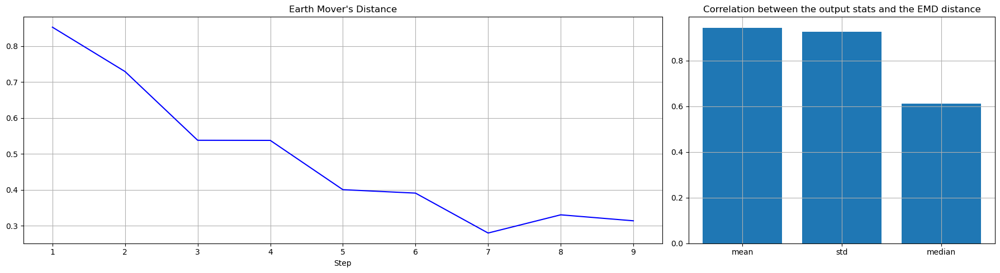

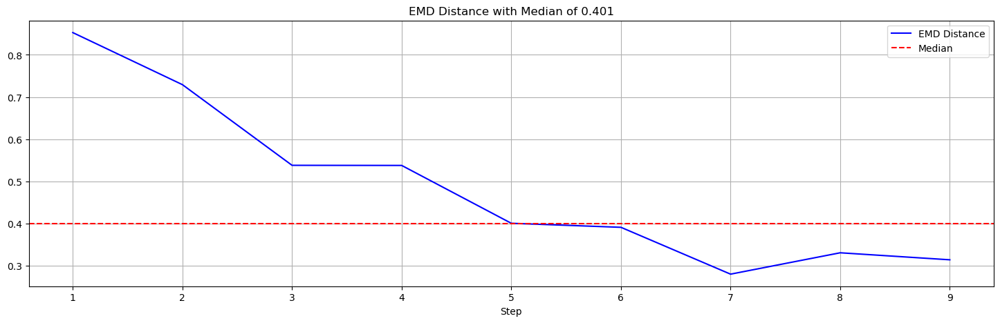

In [20]:
clip = 'MedMov_SparseLargeDrops_15min'
EMD_MedMov_SparseLargeDrops_15min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_SparseLargeDrops_15min_emd = all_plot(EMD_MedMov_SparseLargeDrops_15min, clip)

#### 30 min

Earth Mover's Distance with 30 bins:
Mean: 0.597 (std: 0.238)
Median: 0.483

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


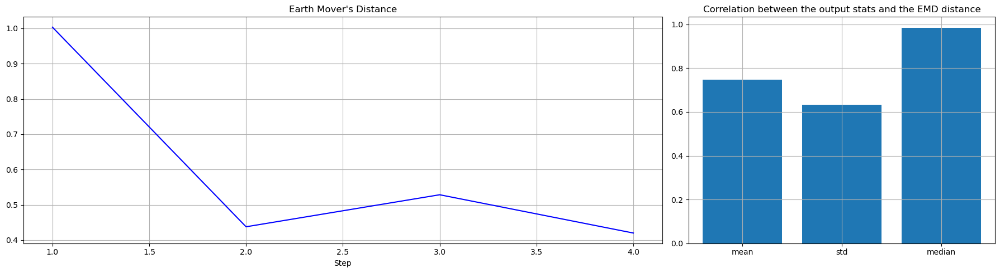

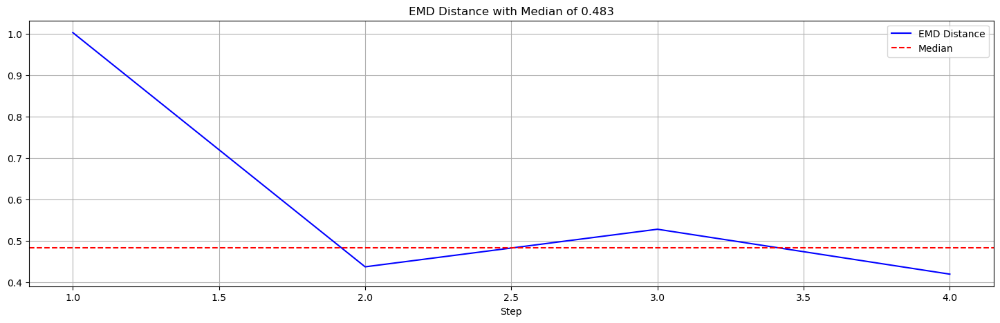

In [21]:
clip = 'MedMov_SparseLargeDrops_30min'
EMD_MedMov_SparseLargeDrops_30min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_SparseLargeDrops_30min_emd = all_plot(EMD_MedMov_SparseLargeDrops_30min, clip)

#### All TLs

Earth Mover's Distance of MedMov_SparseLargeDrops:
Mean: 0.406 (std: 0.100)
Median: 0.393

Earth Mover's Distance of MedMov_SparseLargeDrops_05min:
Mean: 0.411 (std: 0.112)
Median: 0.377

Earth Mover's Distance of MedMov_SparseLargeDrops_15min:
Mean: 0.486 (std: 0.186)
Median: 0.401

Earth Mover's Distance of MedMov_SparseLargeDrops_30min:
Mean: 0.597 (std: 0.238)
Median: 0.483



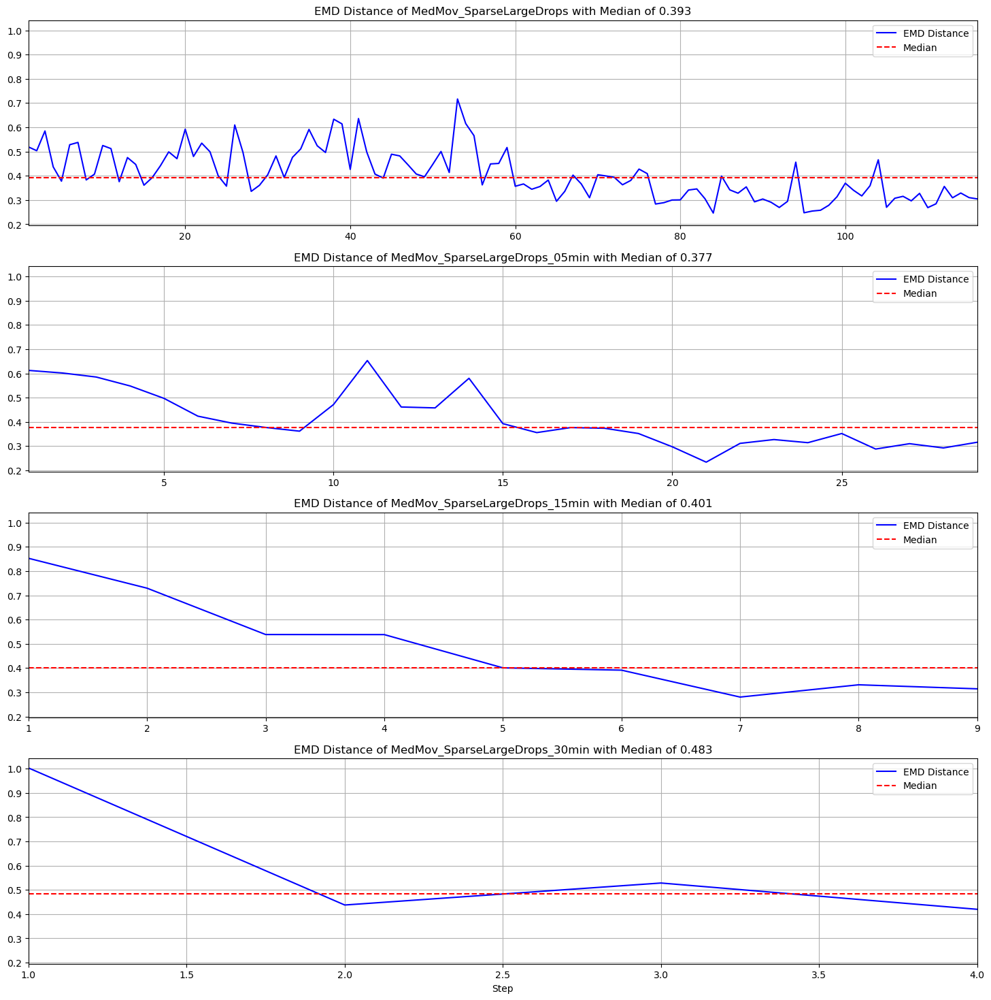

In [51]:
fig, ax = plt.subplots(4, 1, figsize=(18, 18), sharey=True)

for i, (x, title) in enumerate(zip([MedMov_SparseLargeDrops_emd, MedMov_SparseLargeDrops_05min_emd, MedMov_SparseLargeDrops_15min_emd, MedMov_SparseLargeDrops_30min_emd],
                            ['MedMov_SparseLargeDrops', 'MedMov_SparseLargeDrops_05min', 'MedMov_SparseLargeDrops_15min', 'MedMov_SparseLargeDrops_30min'])):
    
    print(f"Earth Mover's Distance of {title}:")
    print(f"Mean: {np.mean(x):.3f} (std: {np.std(x):.3f})")
    print(f"Median: {np.median(x):.3f}")
    print()

    ax[i].plot(range(1, len(x)+1), x, label='EMD Distance', color='blue')
    ax[i].axhline(y=np.median(x), color='red', linestyle='--', label='Median')
    ax[i].set_title(f'EMD Distance of {title} with Median of {np.median(x):.3f}')
    ax[i].set_xlim([1, len(x)])
    ax[i].grid(True)
    ax[i].legend()

ax[3].set_xlabel('Step')
plt.show()

#### Bar Plot

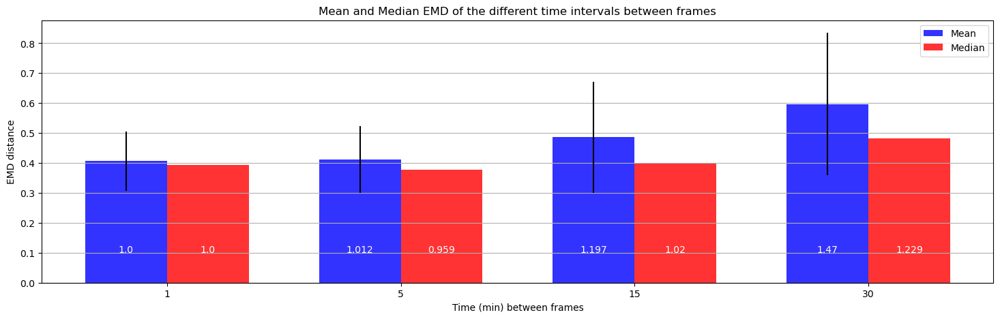

In [22]:
mean_emd_MedMov_SparseLargeDrops = [np.mean(MedMov_SparseLargeDrops_emd), np.mean(MedMov_SparseLargeDrops_05min_emd),
                                    np.mean(MedMov_SparseLargeDrops_15min_emd), np.mean(MedMov_SparseLargeDrops_30min_emd)]

std_emd_MedMov_SparseLargeDrops = [np.std(MedMov_SparseLargeDrops_emd), np.std(MedMov_SparseLargeDrops_05min_emd),
                                      np.std(MedMov_SparseLargeDrops_15min_emd), np.std(MedMov_SparseLargeDrops_30min_emd)]

median_emd_MedMov_SparseLargeDrops = [np.median(MedMov_SparseLargeDrops_emd), np.median(MedMov_SparseLargeDrops_05min_emd),
                                    np.median(MedMov_SparseLargeDrops_15min_emd), np.median(MedMov_SparseLargeDrops_30min_emd)]

mean_emd_MedMov_SparseLargeDrops = [round(x, 3) for x in mean_emd_MedMov_SparseLargeDrops]
std_emd_MedMov_SparseLargeDrops = [round(x, 3) for x in std_emd_MedMov_SparseLargeDrops]
median_emd_MedMov_SparseLargeDrops = [round(x, 3) for x in median_emd_MedMov_SparseLargeDrops]

# bar plot of the mean and the median of EMD of MedMov_SparseLargeDrops next to each other
fig, ax = plt.subplots(figsize=(18, 5))
index = np.arange(4)
bar_width = 0.35
opacity = 0.8

rects1 = ax.bar(index, mean_emd_MedMov_SparseLargeDrops, bar_width, yerr=std_emd_MedMov_SparseLargeDrops, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median_emd_MedMov_SparseLargeDrops, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Time (min) between frames')
ax.set_ylabel('EMD distance')
ax.set_title('Mean and Median EMD of the different time intervals between frames')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('1', '5', '15', '30'))
ax.yaxis.grid(True)
ax.legend()

# plot the relative mean EMD distances relative to the 1 min time interval into the same plot
rel_mean_emd_MedMov_SparseLargeDrops =  [round(x/mean_emd_MedMov_SparseLargeDrops[0], 3) for x in mean_emd_MedMov_SparseLargeDrops]
rel_median_emd_MedMov_SparseLargeDrops = [round(x/median_emd_MedMov_SparseLargeDrops[0], 3) for x in median_emd_MedMov_SparseLargeDrops]

# Add numbers on top of each bar
for i, value in enumerate(rel_mean_emd_MedMov_SparseLargeDrops):
    ax.text(i, 0.1, str(value), ha='center', color='white')

for i, value in enumerate(rel_median_emd_MedMov_SparseLargeDrops):
    ax.text(i+bar_width, 0.1, str(value), ha='center', color='white')

## MedMov_LargeDrop

#### Full

Earth Mover's Distance with 30 bins:
Mean: 0.288 (std: 0.075)
Median: 0.278

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


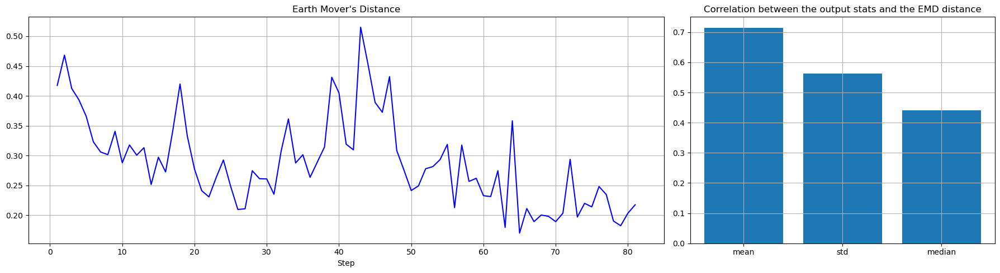

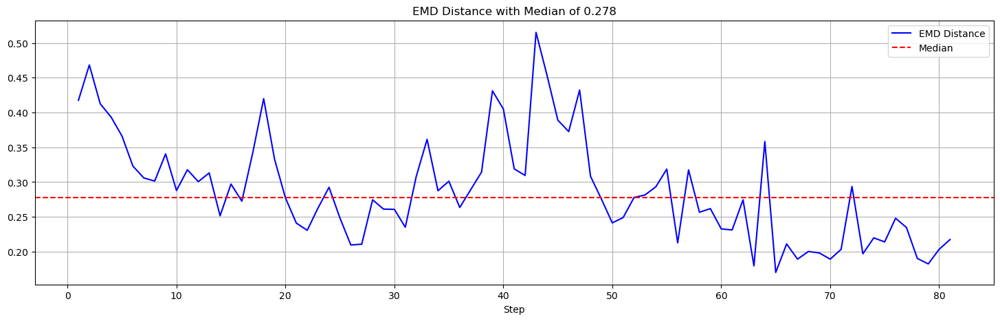

In [23]:
clip = 'MedMov_LargeDrop'
EMD_MedMov_LargeDrop = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_LargeDrop_emd = all_plot(EMD_MedMov_LargeDrop, clip)

#### 5 min

Earth Mover's Distance with 30 bins:
Mean: 0.406 (std: 0.149)
Median: 0.395

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


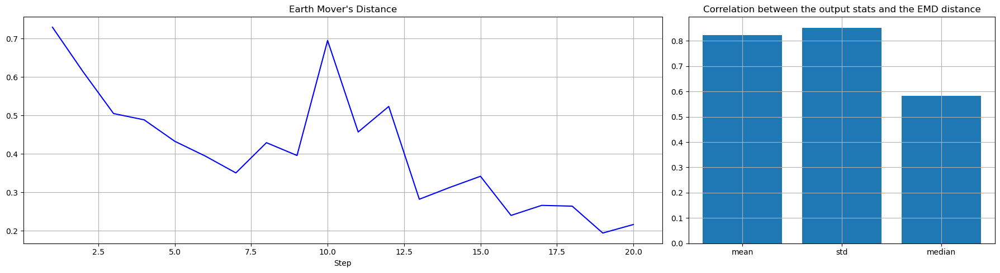

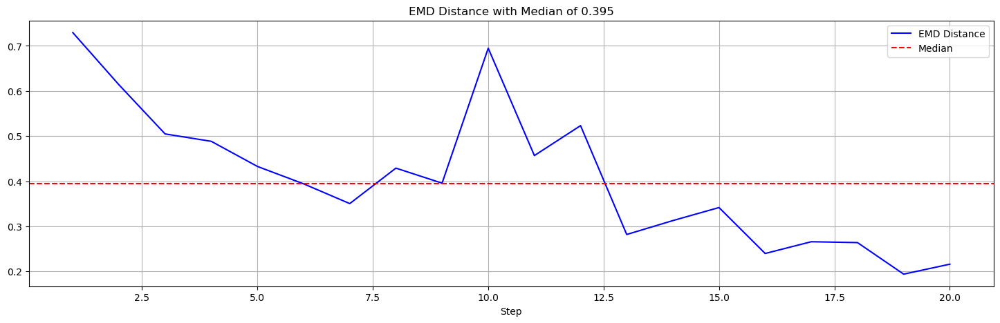

In [24]:
clip = 'MedMov_LargeDrop_05min'
EMD_MedMov_LargeDrop_05min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_LargeDrop_05min_emd = all_plot(EMD_MedMov_LargeDrop_05min, clip)

#### 15 min

Earth Mover's Distance with 30 bins:
Mean: 0.594 (std: 0.246)
Median: 0.566

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


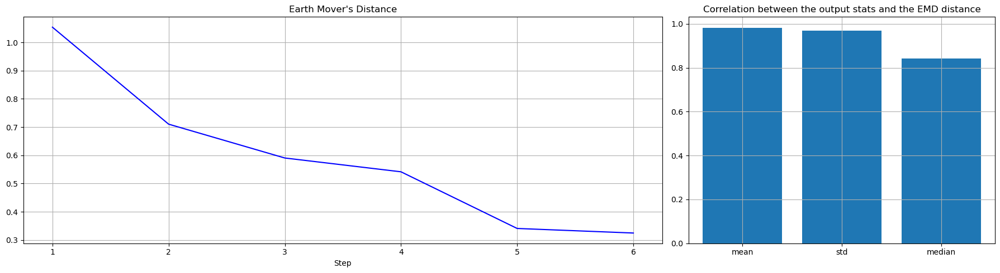

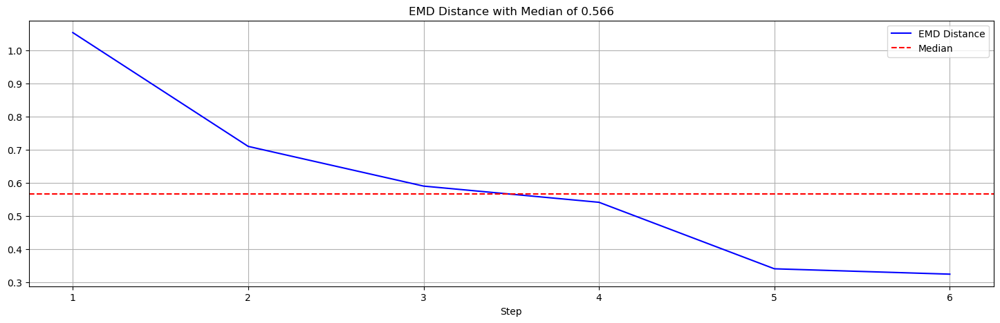

In [25]:
clip = 'MedMov_LargeDrop_15min'
EMD_MedMov_LargeDrop_15min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_LargeDrop_15min_emd = all_plot(EMD_MedMov_LargeDrop_15min, clip)

#### 30 min

Earth Mover's Distance with 30 bins:
Mean: 0.913 (std: 0.385)
Median: 0.895

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


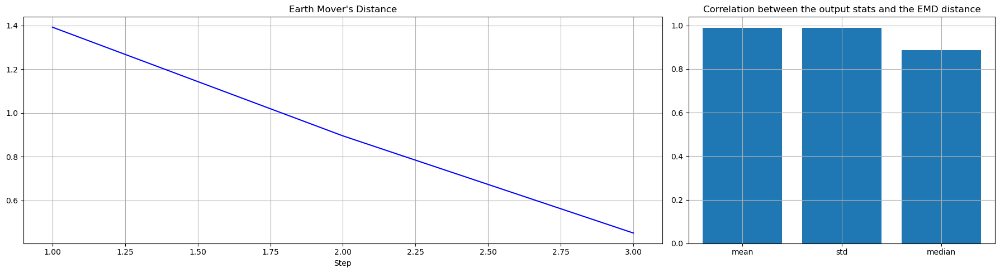

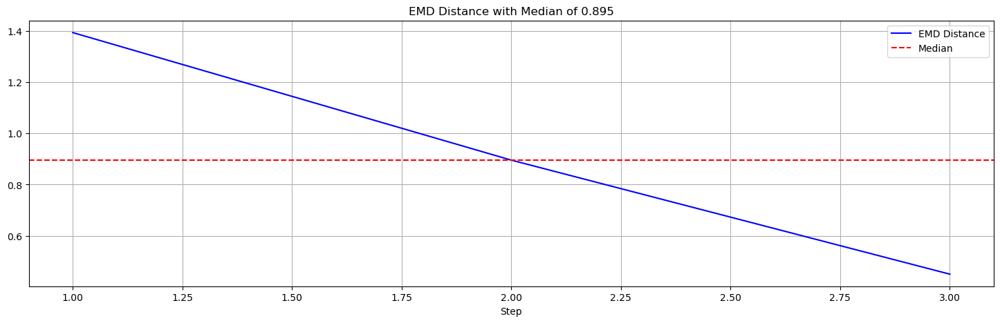

In [26]:
clip = 'MedMov_LargeDrop_30min'
EMD_MedMov_LargeDrop_30min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

MedMov_LargeDrop_30min_emd = all_plot(EMD_MedMov_LargeDrop_30min, clip)

#### All TLs

Earth Mover's Distance of MedMov_LargeDrop:
Mean: 0.288 (std: 0.075)
Median: 0.278

Earth Mover's Distance of MedMov_LargeDrop_05min:
Mean: 0.406 (std: 0.149)
Median: 0.395

Earth Mover's Distance of MedMov_LargeDrop_15min:
Mean: 0.594 (std: 0.246)
Median: 0.566

Earth Mover's Distance of MedMov_LargeDrop_30min:
Mean: 0.913 (std: 0.385)
Median: 0.895



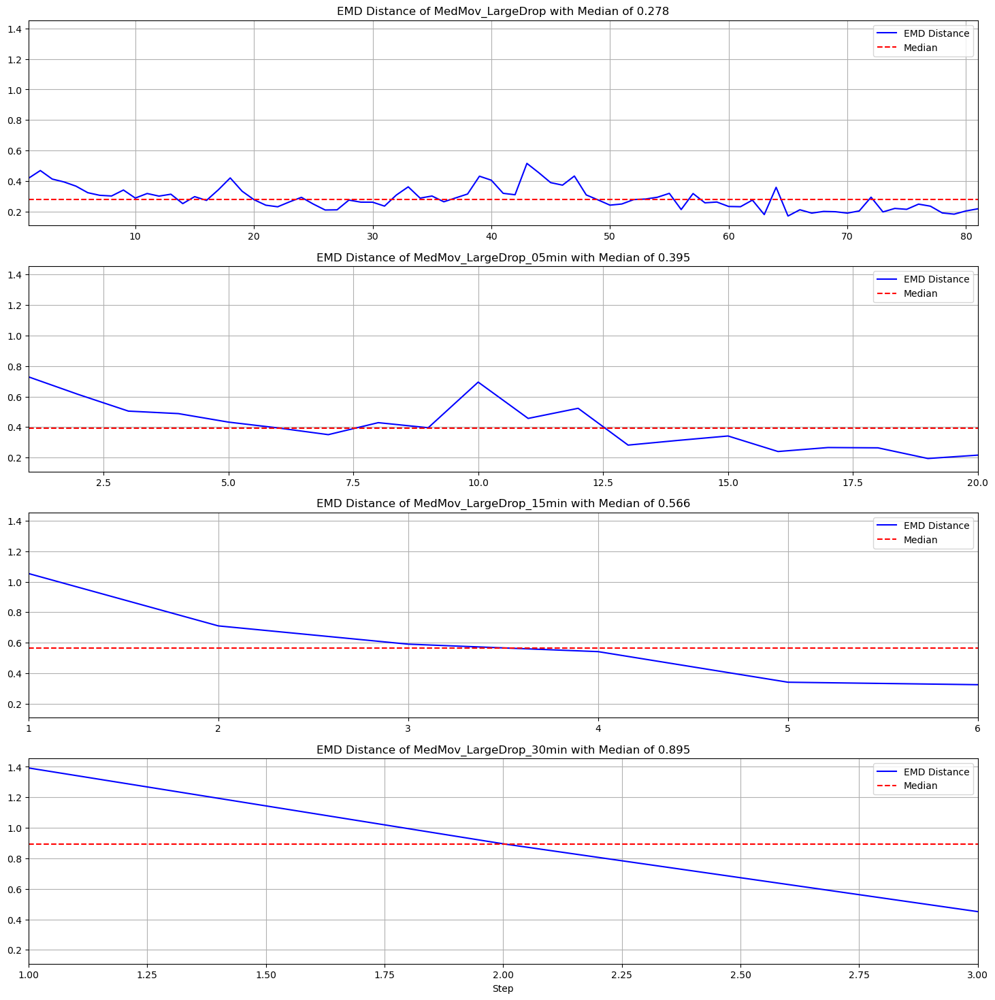

In [52]:
fig, ax = plt.subplots(4, 1, figsize=(18, 18), sharey=True)

for i, (x, title) in enumerate(zip([MedMov_LargeDrop_emd, MedMov_LargeDrop_05min_emd, MedMov_LargeDrop_15min_emd, MedMov_LargeDrop_30min_emd],
                            ['MedMov_LargeDrop', 'MedMov_LargeDrop_05min', 'MedMov_LargeDrop_15min', 'MedMov_LargeDrop_30min'])):
    
    print(f"Earth Mover's Distance of {title}:")
    print(f"Mean: {np.mean(x):.3f} (std: {np.std(x):.3f})")
    print(f"Median: {np.median(x):.3f}")
    print()

    ax[i].plot(range(1, len(x)+1), x, label='EMD Distance', color='blue')
    ax[i].axhline(y=np.median(x), color='red', linestyle='--', label='Median')
    ax[i].set_title(f'EMD Distance of {title} with Median of {np.median(x):.3f}')
    ax[i].set_xlim([1, len(x)])
    ax[i].grid(True)
    ax[i].legend()

ax[3].set_xlabel('Step')
plt.show()

#### Bar Plot

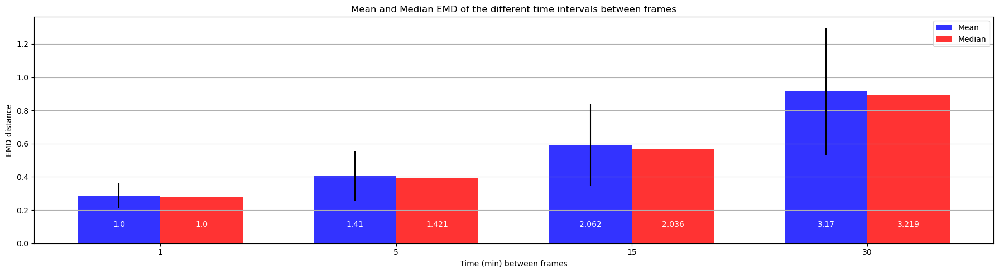

In [27]:
# bar plot of the mean EMD distances of MedMov_LargeDrop
mean_emd_MedMov_LargeDrop = [np.mean(MedMov_LargeDrop_emd), np.mean(MedMov_LargeDrop_05min_emd), np.mean(MedMov_LargeDrop_15min_emd), np.mean(MedMov_LargeDrop_30min_emd)]
std_emd_MedMov_LargeDrop = [np.std(MedMov_LargeDrop_emd), np.std(MedMov_LargeDrop_05min_emd), np.std(MedMov_LargeDrop_15min_emd), np.std(MedMov_LargeDrop_30min_emd)]
median_emd_MedMov_LargeDrop = [np.median(MedMov_LargeDrop_emd), np.median(MedMov_LargeDrop_05min_emd), np.median(MedMov_LargeDrop_15min_emd), np.median(MedMov_LargeDrop_30min_emd)]

mean_emd_MedMov_LargeDrop = [round(x, 3) for x in mean_emd_MedMov_LargeDrop]
std_emd_MedMov_LargeDrop = [round(x, 3) for x in std_emd_MedMov_LargeDrop]
median_emd_MedMov_LargeDrop = [round(x, 3) for x in median_emd_MedMov_LargeDrop]

# bar plot of the mean and the median of EMD of MedMov_LargeDrop next to each other
fig, ax = plt.subplots(figsize=(18, 5))
index = np.arange(4)
bar_width = 0.35
opacity = 0.8

rects1 = ax.bar(index, mean_emd_MedMov_LargeDrop, bar_width, yerr=std_emd_MedMov_LargeDrop, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median_emd_MedMov_LargeDrop, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Time (min) between frames')
ax.set_ylabel('EMD distance')
ax.set_title('Mean and Median EMD of the different time intervals between frames')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('1', '5', '15', '30'))
ax.yaxis.grid(True)
ax.legend()

# plot the relative mean EMD distances relative to the 1 min time interval into the same plot
rel_mean_emd_MedMov_LargeDrop =  [round(x/mean_emd_MedMov_LargeDrop[0], 3) for x in mean_emd_MedMov_LargeDrop]
rel_median_emd_MedMov_LargeDrop = [round(x/median_emd_MedMov_LargeDrop[0], 3) for x in median_emd_MedMov_LargeDrop]

# Add numbers on top of each bar
for i, value in enumerate(rel_mean_emd_MedMov_LargeDrop):
    ax.text(i, 0.1, str(value), ha='center', color='white')

for i, value in enumerate(rel_median_emd_MedMov_LargeDrop):
    ax.text(i+bar_width, 0.1, str(value), ha='center', color='white')

plt.tight_layout()
plt.show()

## LargeMov_Shift

#### Full

Earth Mover's Distance with 30 bins:
Mean: 0.827 (std: 0.787)
Median: 0.439

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


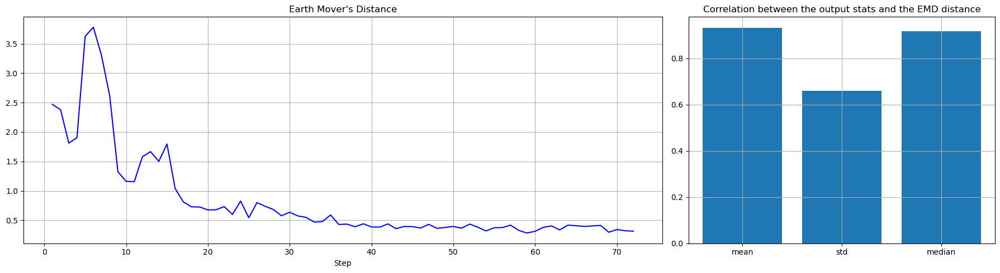

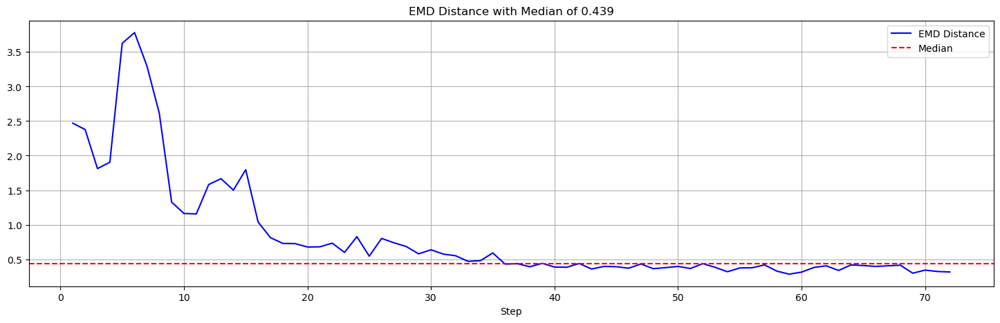

In [28]:
clip = 'LargeMov_Shift'
EMD_LargeMov_Shift = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

LargeMov_Shift_emd = all_plot(EMD_LargeMov_Shift, clip)

#### 5 min

Earth Mover's Distance with 30 bins:
Mean: 2.048 (std: 2.773)
Median: 0.843

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


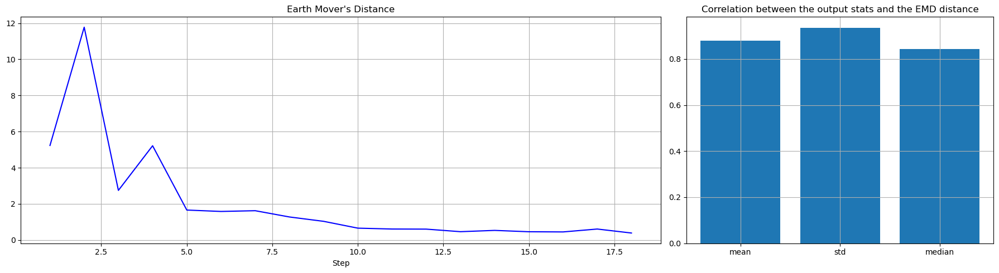

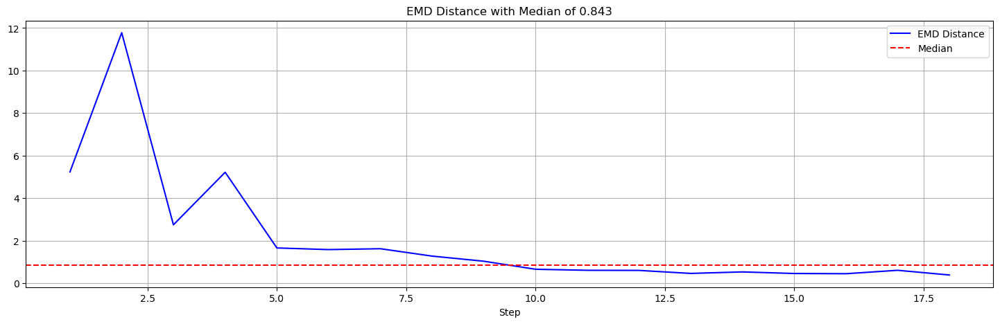

In [29]:
clip = 'LargeMov_Shift_05min'
EMD_LargeMov_Shift_05min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

LargeMov_Shift_05min_emd = all_plot(EMD_LargeMov_Shift_05min, clip)

#### 15 min

Earth Mover's Distance with 30 bins:
Mean: 3.558 (std: 3.133)
Median: 2.167

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


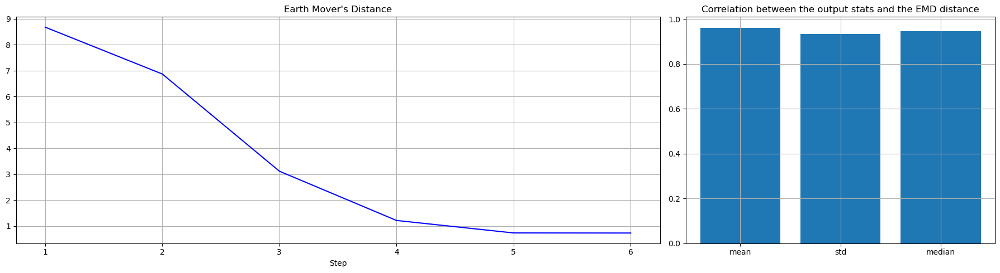

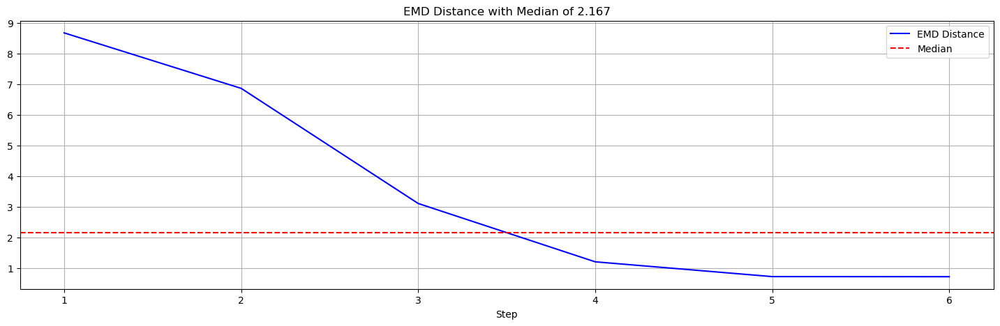

In [30]:
clip = 'LargeMov_Shift_15min'
EMD_LargeMov_Shift_15min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

LargeMov_Shift_15min_emd = all_plot(EMD_LargeMov_Shift_15min, clip)

#### 30 min

Earth Mover's Distance with 30 bins:
Mean: 3.327 (std: 1.628)
Median: 3.708

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


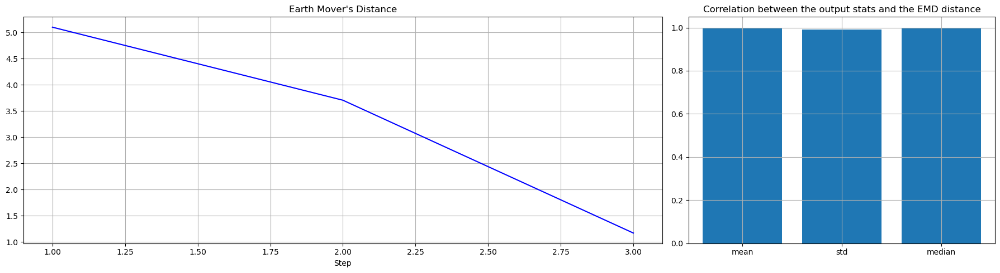

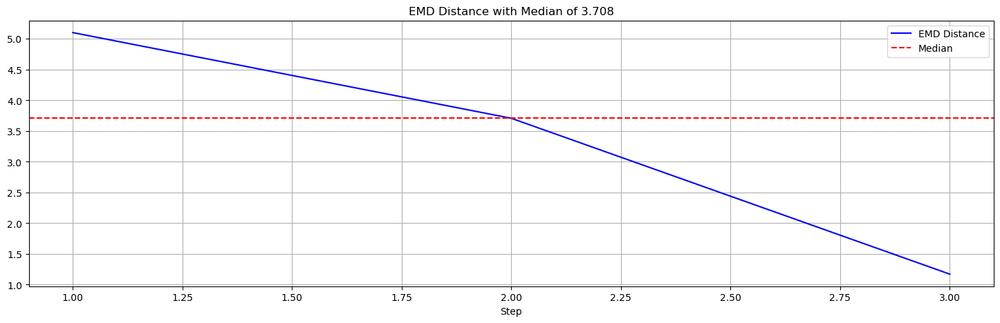

In [31]:
clip = 'LargeMov_Shift_30min'
EMD_LargeMov_Shift_30min = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

LargeMov_Shift_30min_emd = all_plot(EMD_LargeMov_Shift_30min, clip)

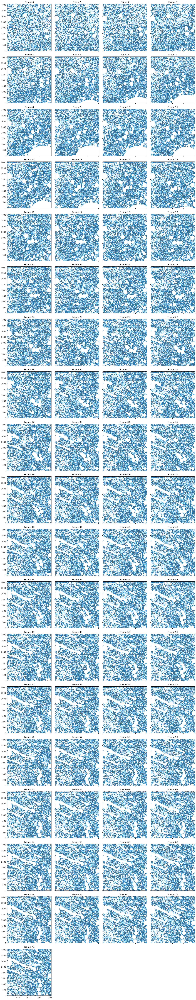

In [56]:
EMD_LargeMov_Shift.plot_positions()

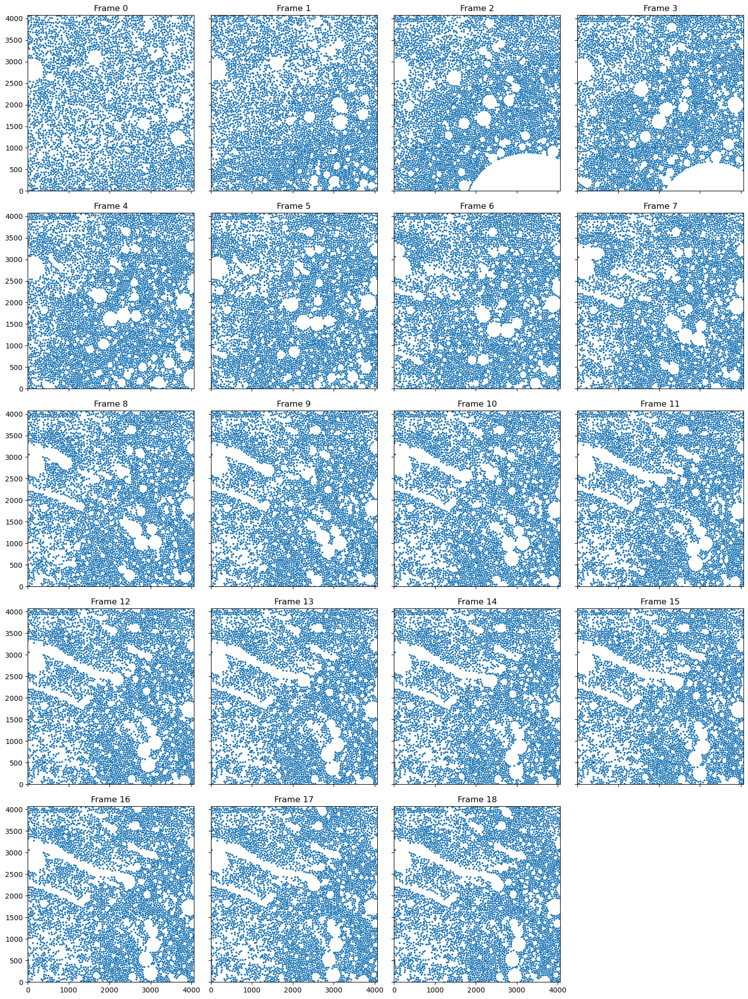

In [57]:
EMD_LargeMov_Shift_05min.plot_positions()

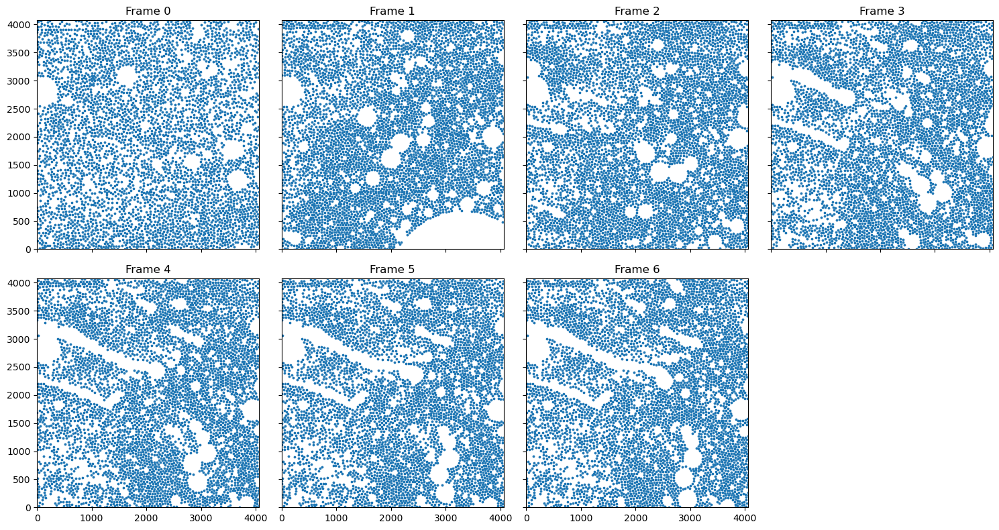

In [55]:
EMD_LargeMov_Shift_15min.plot_positions()

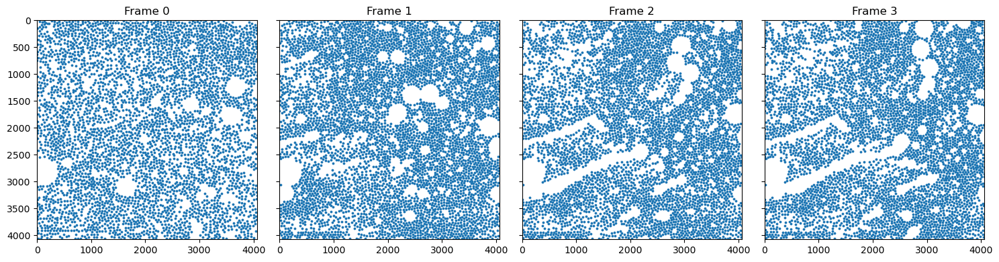

In [54]:
EMD_LargeMov_Shift_30min.plot_positions()

#### ALl TLs

Earth Mover's Distance of LargeMov_Shift:
Mean: 0.827 (std: 0.787)
Median: 0.439

Earth Mover's Distance of LargeMov_Shift_05min:
Mean: 2.048 (std: 2.773)
Median: 0.843

Earth Mover's Distance of LargeMov_Shift_15min:
Mean: 3.558 (std: 3.133)
Median: 2.167

Earth Mover's Distance of LargeMov_Shift_30min:
Mean: 3.327 (std: 1.628)
Median: 3.708



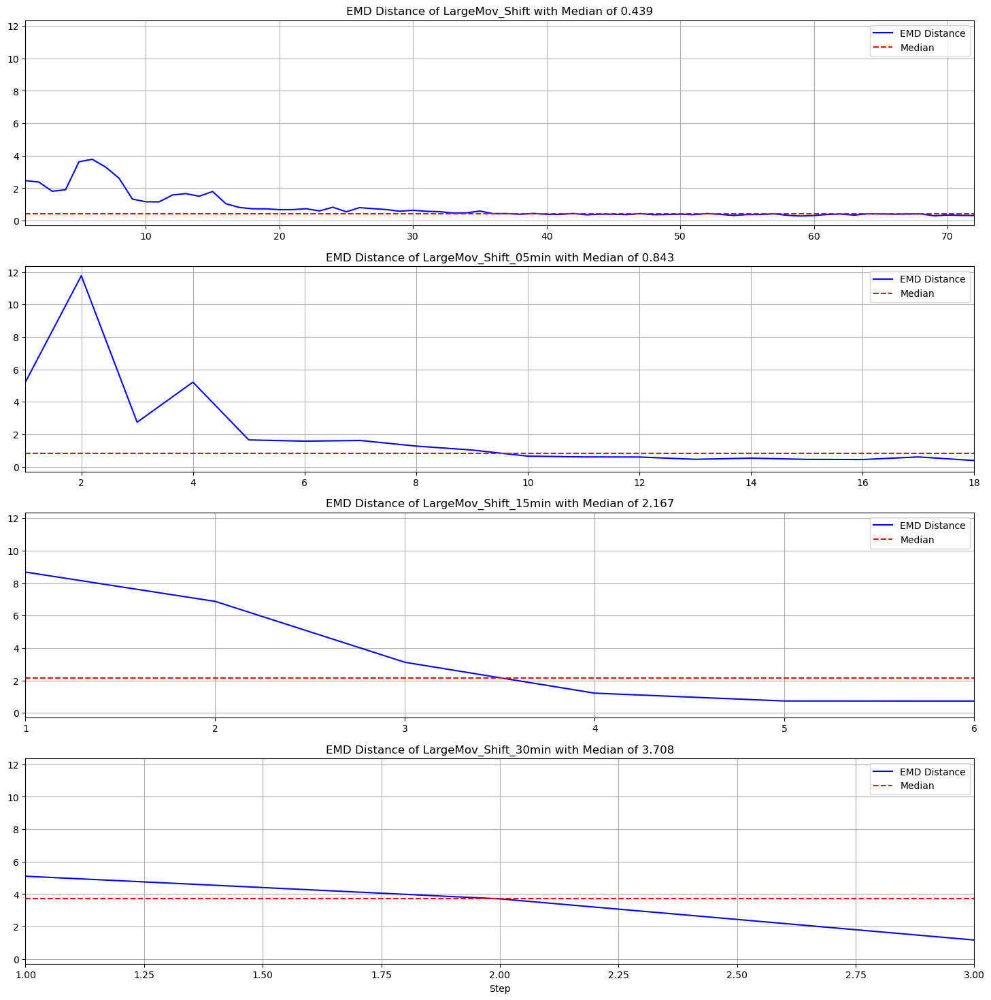

In [53]:
fig, ax = plt.subplots(4, 1, figsize=(18, 18), sharey=True)

for i, (x, title) in enumerate(zip([LargeMov_Shift_emd, LargeMov_Shift_05min_emd, LargeMov_Shift_15min_emd, LargeMov_Shift_30min_emd],
                            ['LargeMov_Shift', 'LargeMov_Shift_05min', 'LargeMov_Shift_15min', 'LargeMov_Shift_30min'])):
    
    print(f"Earth Mover's Distance of {title}:")
    print(f"Mean: {np.mean(x):.3f} (std: {np.std(x):.3f})")
    print(f"Median: {np.median(x):.3f}")
    print()

    ax[i].plot(range(1, len(x)+1), x, label='EMD Distance', color='blue')
    ax[i].axhline(y=np.median(x), color='red', linestyle='--', label='Median')
    ax[i].set_title(f'EMD Distance of {title} with Median of {np.median(x):.3f}')
    ax[i].set_xlim([1, len(x)])
    ax[i].grid(True)
    ax[i].legend()

ax[3].set_xlabel('Step')
plt.show()

#### Bar Plot

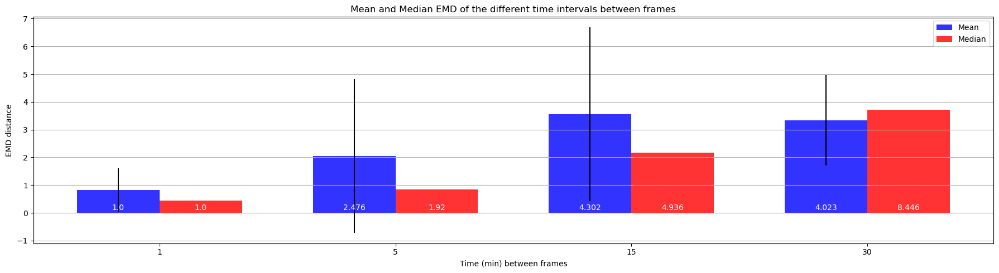

In [32]:
# bar plot of the mean EMD distances of LargeMov_Shift
mean_emd_LargeMov_Shift = [np.mean(LargeMov_Shift_emd), np.mean(LargeMov_Shift_05min_emd), np.mean(LargeMov_Shift_15min_emd), np.mean(LargeMov_Shift_30min_emd)]
std_emd_LargeMov_Shift = [np.std(LargeMov_Shift_emd), np.std(LargeMov_Shift_05min_emd), np.std(LargeMov_Shift_15min_emd), np.std(LargeMov_Shift_30min_emd)]
median_emd_LargeMov_Shift = [np.median(LargeMov_Shift_emd), np.median(LargeMov_Shift_05min_emd), np.median(LargeMov_Shift_15min_emd), np.median(LargeMov_Shift_30min_emd)]

mean_emd_LargeMov_Shift = [round(x, 3) for x in mean_emd_LargeMov_Shift]
std_emd_LargeMov_Shift = [round(x, 3) for x in std_emd_LargeMov_Shift]
median_emd_LargeMov_Shift = [round(x, 3) for x in median_emd_LargeMov_Shift]

# bar plot of the mean and the median of EMD of LargeMov_Shift next to each other
fig, ax = plt.subplots(figsize=(18, 5))
index = np.arange(4)
bar_width = 0.35
opacity = 0.8

rects1 = ax.bar(index, mean_emd_LargeMov_Shift, bar_width, yerr=std_emd_LargeMov_Shift, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median_emd_LargeMov_Shift, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Time (min) between frames')
ax.set_ylabel('EMD distance')
ax.set_title('Mean and Median EMD of the different time intervals between frames')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('1', '5', '15', '30'))
ax.yaxis.grid(True)
ax.legend()

# plot the relative mean EMD distances relative to the 1 min time interval into the same plot
rel_mean_emd_LargeMov_Shift =  [round(x / mean_emd_LargeMov_Shift[0],3) for x in mean_emd_LargeMov_Shift]
rel_median_emd_LargeMov_Shift = [round(x / median_emd_LargeMov_Shift[0],3) for x in median_emd_LargeMov_Shift]

# Add numbers on top of each bar
for i, value in enumerate(rel_mean_emd_LargeMov_Shift):
    ax.text(i, 0.1, str(value), ha='center', color='white')

for i, value in enumerate(rel_median_emd_LargeMov_Shift):
    ax.text(i+bar_width, 0.1, str(value), ha='center', color='white')

plt.tight_layout()
plt.show()

### All Results

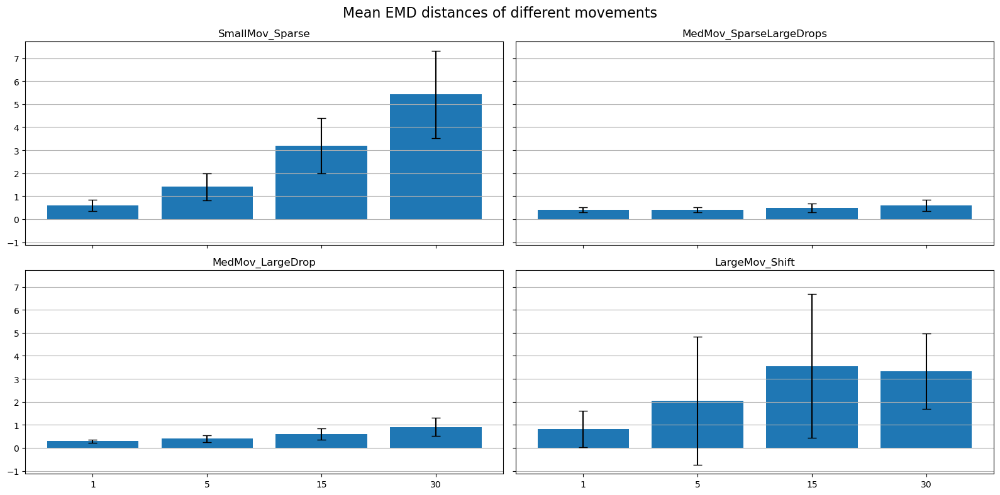

In [33]:
# plot all 4 bar plots in one figure
fig, ax = plt.subplots(2, 2, figsize=(16, 8), sharex=True, sharey=True)

# Title over all the plots
fig.suptitle('Mean EMD distances of different movements', fontsize=16)

for (i, j), title, mean, std in zip([(0, 0), (0, 1), (1, 0), (1, 1)], ['SmallMov_Sparse', 'MedMov_SparseLargeDrops', 'MedMov_LargeDrop', 'LargeMov_Shift'],
                                    [mean_emd_SmallMov_Sparse, mean_emd_MedMov_SparseLargeDrops, mean_emd_MedMov_LargeDrop, mean_emd_LargeMov_Shift],
                                    [std_emd_SmallMov_Sparse, std_emd_MedMov_SparseLargeDrops, std_emd_MedMov_LargeDrop, std_emd_LargeMov_Shift]):
    ax[i, j].bar(['1', '5', '15', '30'], mean, yerr=std, capsize=5)
    ax[i, j].set_title(title)
    ax[i, j].yaxis.grid(True)

plt.tight_layout()
plt.show()

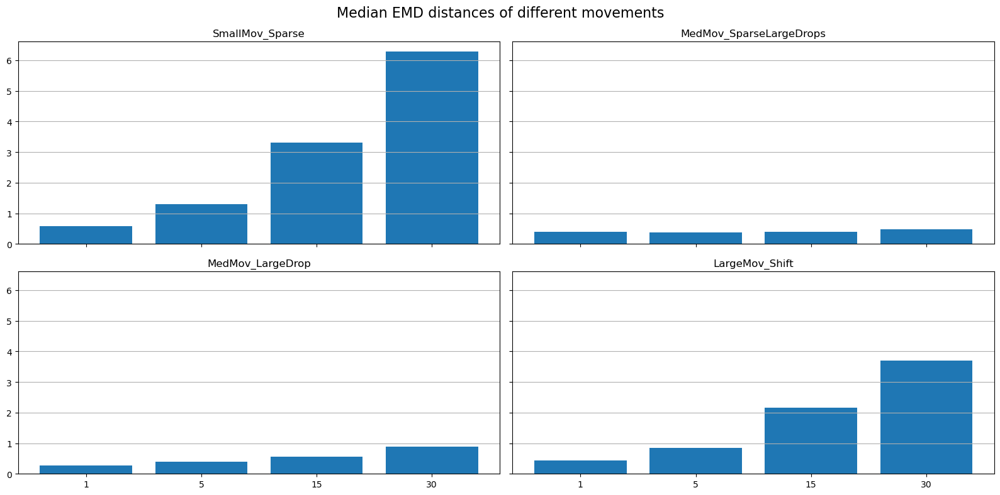

In [34]:
# plot all 4 bar plots in one figure
fig, ax = plt.subplots(2, 2, figsize=(16, 8), sharex=True, sharey=True)

# Title over all the plots
fig.suptitle('Median EMD distances of different movements', fontsize=16)

for (i, j), title, median in zip([(0, 0), (0, 1), (1, 0), (1, 1)], ['SmallMov_Sparse', 'MedMov_SparseLargeDrops', 'MedMov_LargeDrop', 'LargeMov_Shift'], 
                                 [median_emd_SmallMov_Sparse, median_emd_MedMov_SparseLargeDrops, median_emd_MedMov_LargeDrop, median_emd_LargeMov_Shift]):
    ax[i, j].bar(['1', '5', '15', '30'], median, capsize=5)
    ax[i, j].set_title(title)
    ax[i, j].yaxis.grid(True)

plt.tight_layout()
plt.show()

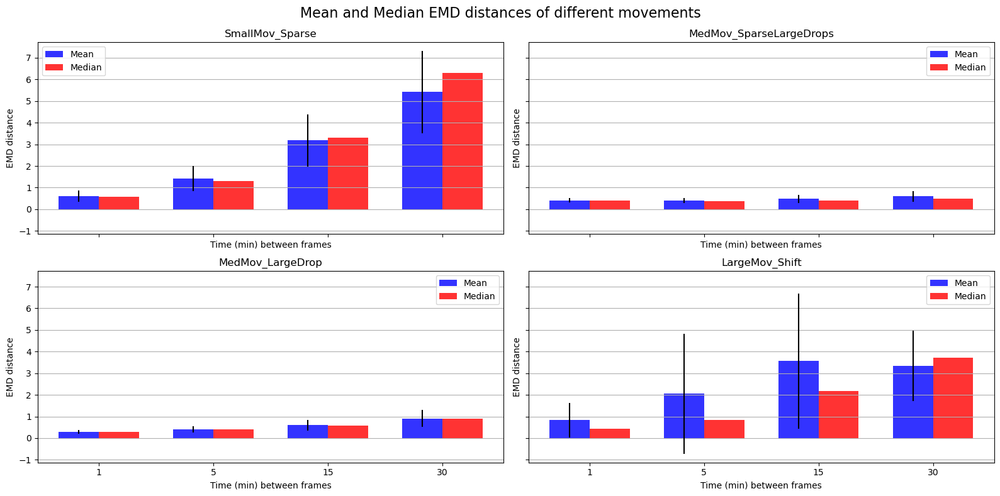

In [35]:
# plot all 4 bar plots in one figure
fig, ax = plt.subplots(2, 2, figsize=(16, 8), sharex=True, sharey=True)

index = np.arange(4)
bar_width = 0.35
opacity = 0.8

# Title over all the plots
fig.suptitle('Mean and Median EMD distances of different movements', fontsize=16)

for (i, j), title, mean, std, median in zip([(0, 0), (0, 1), (1, 0), (1, 1)], 
                                            ['SmallMov_Sparse', 'MedMov_SparseLargeDrops', 'MedMov_LargeDrop', 'LargeMov_Shift'], 
                                            [mean_emd_SmallMov_Sparse, mean_emd_MedMov_SparseLargeDrops, mean_emd_MedMov_LargeDrop, mean_emd_LargeMov_Shift], 
                                            [std_emd_SmallMov_Sparse, std_emd_MedMov_SparseLargeDrops, std_emd_MedMov_LargeDrop, std_emd_LargeMov_Shift], 
                                            [median_emd_SmallMov_Sparse, median_emd_MedMov_SparseLargeDrops, median_emd_MedMov_LargeDrop, median_emd_LargeMov_Shift]):
    
    rects1 = ax[i, j].bar(index, mean, bar_width, yerr=std, alpha=opacity, color='b', label='Mean')
    rects2 = ax[i, j].bar(index + bar_width, median, bar_width, alpha=opacity, color='r', label='Median')
    ax[i, j].set_title(title)
    ax[i, j].set_xlabel('Time (min) between frames')
    ax[i, j].set_ylabel('EMD distance')
    ax[i, j].legend()
    ax[i, j].set_xticks(index + bar_width / 2)
    ax[i, j].set_xticklabels(('1', '5', '15', '30'))
    ax[i, j].yaxis.grid(True)

plt.tight_layout()
plt.show()

## Luca's Experiments

#### Exp3_03_short_small_large

Earth Mover's Distance with 30 bins:
Mean: 2.116 (std: 1.582)
Median: 2.360

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


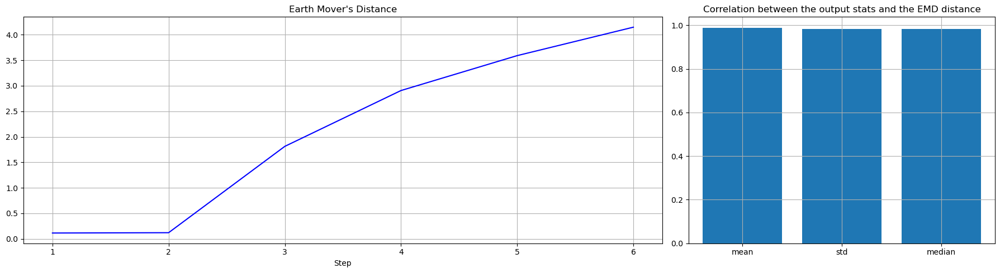

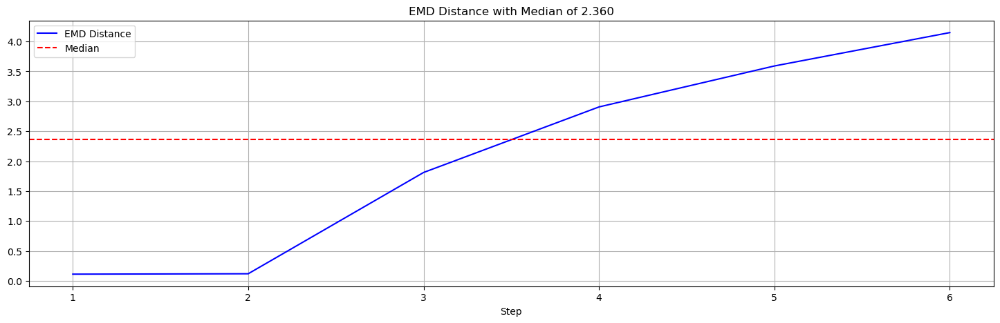

In [36]:
clip = 'Exp3_03_short_small_large'
EMD_Exp3_03_short_small_large = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

Exp3_03_short_small_large_emd = all_plot(EMD_Exp3_03_short_small_large, clip)

#### Exp3_09_no_small

Earth Mover's Distance with 30 bins:
Mean: 0.321 (std: 0.187)
Median: 0.249

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


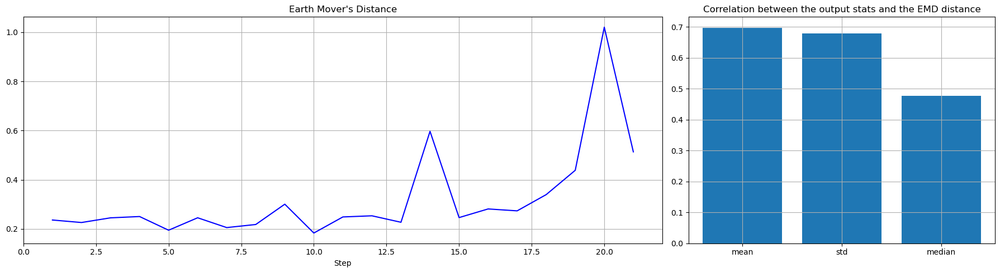

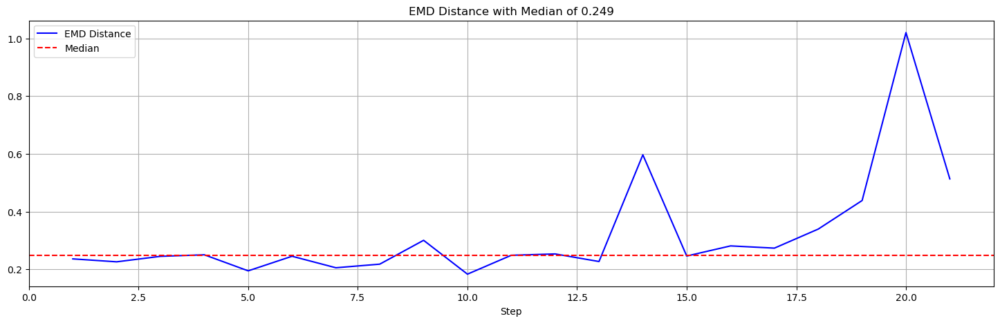

In [37]:
clip = 'Exp3_09_no_small'
EMD_Exp3_09_no_small = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

Exp3_09_no_small_emd = all_plot(EMD_Exp3_09_no_small, clip)


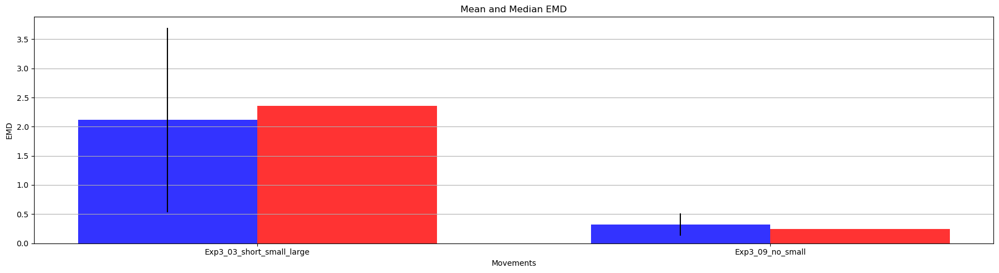

In [38]:
mean_emd_Exp3_03_short_small_large = round(np.mean(Exp3_03_short_small_large_emd), 3)
mean_emd_Exp3_09_no_small = round(np.mean(Exp3_09_no_small_emd), 3)

std_emd_Exp3_03_short_small_large = round(np.std(Exp3_03_short_small_large_emd), 3)
std_emd_Exp3_09_no_small = round(np.std(Exp3_09_no_small_emd), 3)

median_emd_Exp3_03_short_small_large = round(np.median(Exp3_03_short_small_large_emd), 3)
median_emd_Exp3_09_no_small = round(np.median(Exp3_09_no_small_emd), 3)

# bar plot of the mean and the median of EMD of Exp3_03_short_small_large and Exp3_09_no_small next to each other
fig, ax = plt.subplots(figsize=(18, 5))
index = np.arange(2)
bar_width = 0.35
opacity = 0.8

mean = [mean_emd_Exp3_03_short_small_large, mean_emd_Exp3_09_no_small]
std = [std_emd_Exp3_03_short_small_large, std_emd_Exp3_09_no_small]
median = [median_emd_Exp3_03_short_small_large, median_emd_Exp3_09_no_small]

rects1 = ax.bar(index, mean, bar_width, yerr=std, alpha=opacity, color='b', label='Mean')
rects2 = ax.bar(index + bar_width, median, bar_width, alpha=opacity, color='r', label='Median')

ax.set_xlabel('Movements')
ax.set_ylabel('EMD')
ax.set_title('Mean and Median EMD')

ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(('Exp3_03_short_small_large', 'Exp3_09_no_small'))
ax.yaxis.grid(True)

plt.tight_layout()
plt.show()

## Pixelshift Experiments

#### 50 Pixel

Earth Mover's Distance with 30 bins:
Mean: 0.421 (std: 0.000)
Median: 0.421



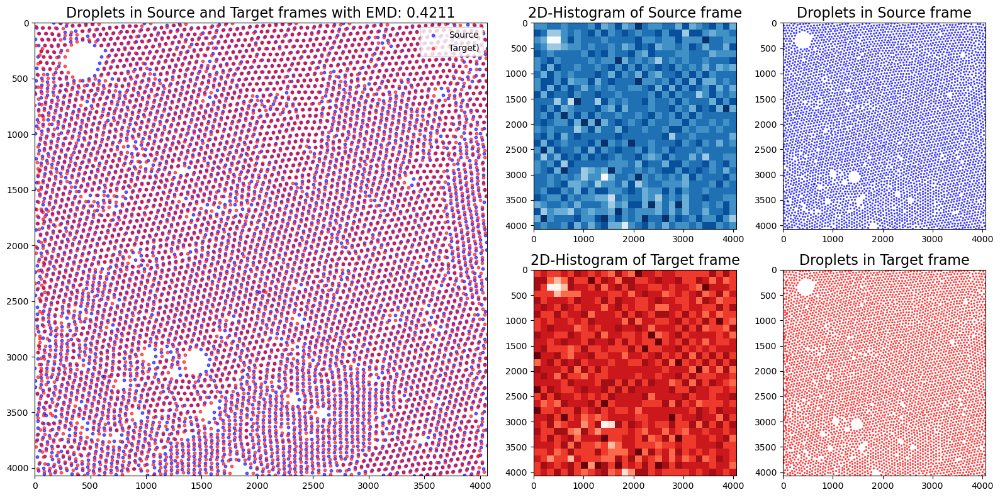

In [59]:
clip = 'Droplet_barcode_noMovement_Shift_50pixelright'
EMD_Droplet_barcode_noMovement_Shift_50pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_50_dist = EMD_Droplet_barcode_noMovement_Shift_50pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_50pixelright.plot_emd()

### 100 pixel

Earth Mover's Distance with 30 bins:
Mean: 0.514 (std: 0.000)
Median: 0.514



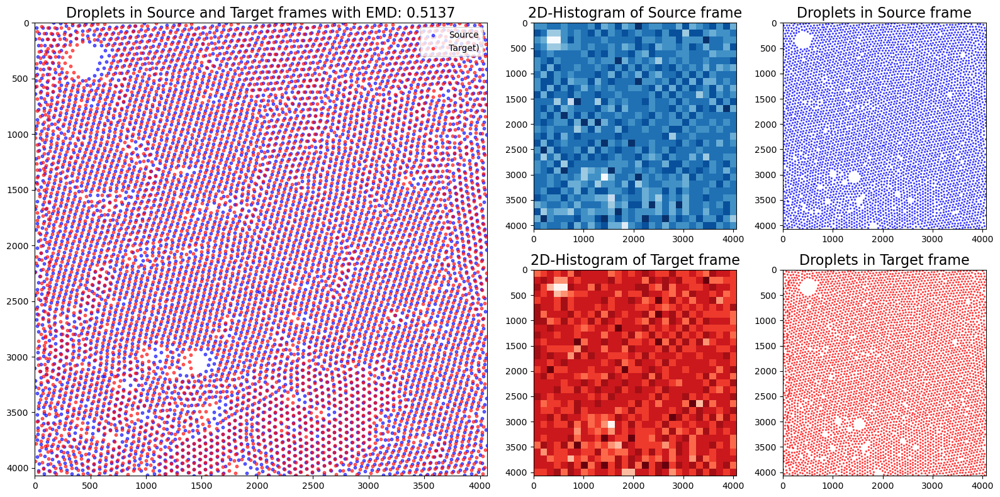

In [60]:
clip = 'Droplet_barcode_noMovement_Shift_100pixelright'
EMD_Droplet_barcode_noMovement_Shift_100pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_100_dist = EMD_Droplet_barcode_noMovement_Shift_100pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_100pixelright.plot_emd()

#### 250 pixel

Earth Mover's Distance with 30 bins:
Mean: 0.625 (std: 0.000)
Median: 0.625



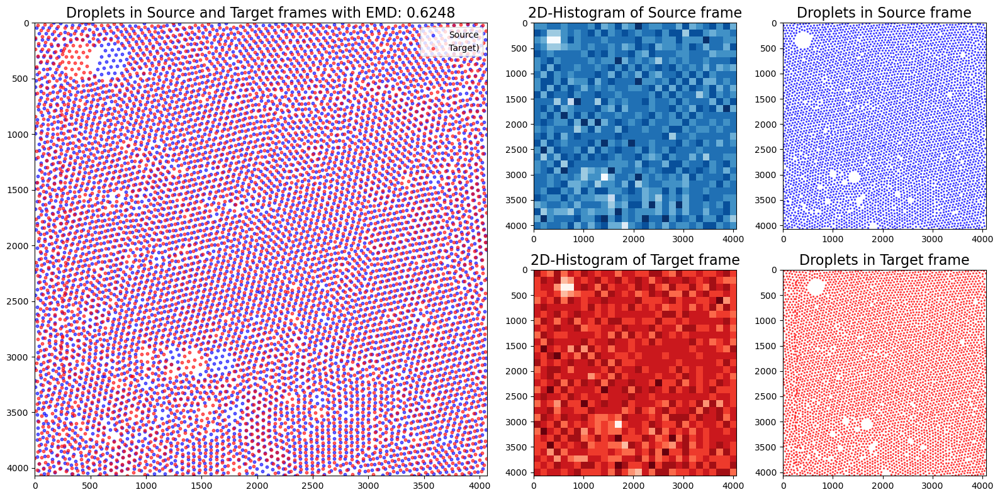

In [61]:
clip = 'Droplet_barcode_noMovement_Shift_250pixelright'
EMD_Droplet_barcode_noMovement_Shift_250pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_250_dist = EMD_Droplet_barcode_noMovement_Shift_250pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_250pixelright.plot_emd()

#### 500 pixel

Earth Mover's Distance with 30 bins:
Mean: 0.861 (std: 0.000)
Median: 0.861



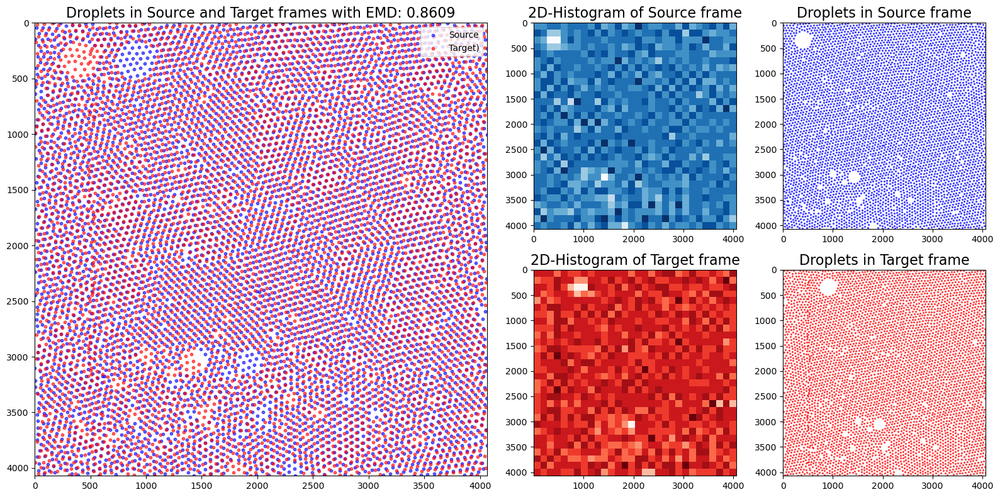

In [62]:
clip = 'Droplet_barcode_noMovement_Shift_500pixelright'
EMD_Droplet_barcode_noMovement_Shift_500pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_500_dist = EMD_Droplet_barcode_noMovement_Shift_500pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_500pixelright.plot_emd()

#### 1000 pixel

Earth Mover's Distance with 30 bins:
Mean: 1.067 (std: 0.000)
Median: 1.067



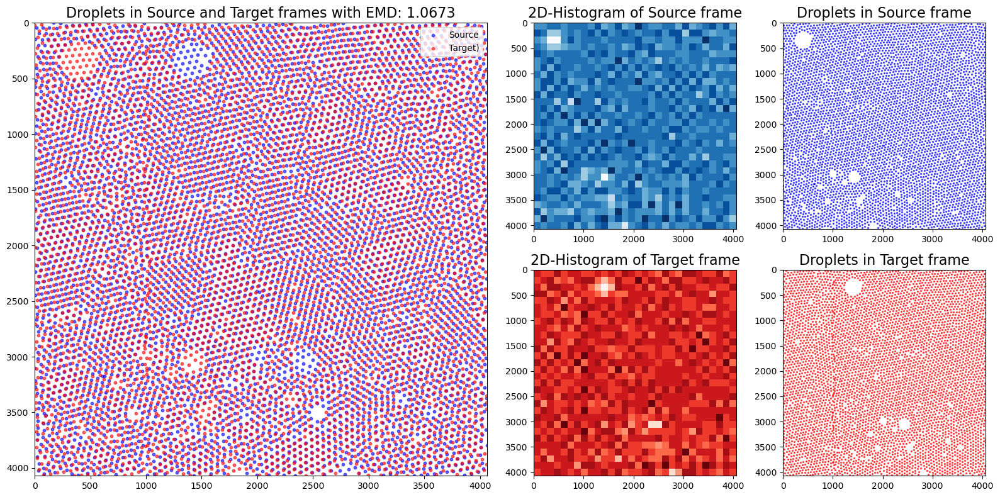

In [63]:
clip = 'Droplet_barcode_noMovement_Shift_1000pixelright'
EMD_Droplet_barcode_noMovement_Shift_1000pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_1000_dist = EMD_Droplet_barcode_noMovement_Shift_1000pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_1000pixelright.plot_emd()

#### 2000 pixel

Earth Mover's Distance with 30 bins:
Mean: 1.313 (std: 0.000)
Median: 1.313



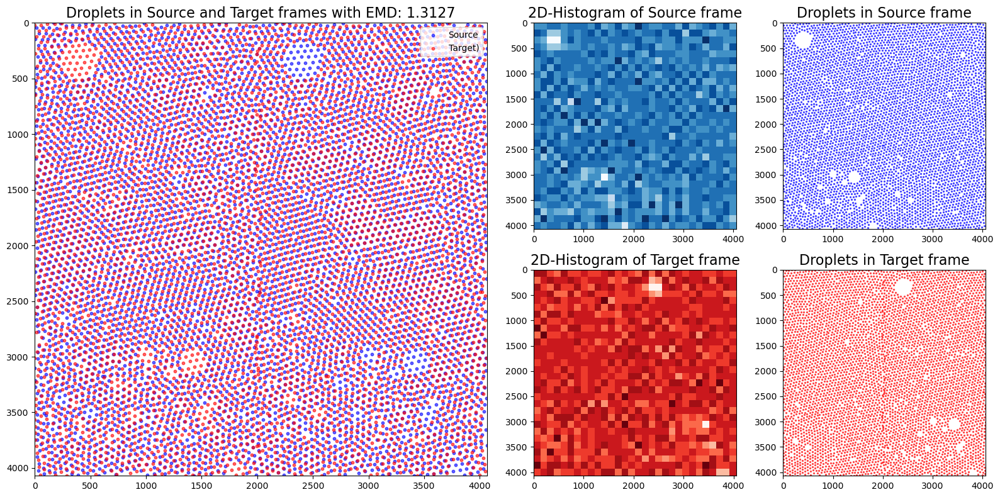

In [64]:
clip = 'Droplet_barcode_noMovement_Shift_2000pixelright'
EMD_Droplet_barcode_noMovement_Shift_2000pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_2000_dist = EMD_Droplet_barcode_noMovement_Shift_2000pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_2000pixelright.plot_emd()

#### 3000 pixel

Earth Mover's Distance with 30 bins:
Mean: 1.172 (std: 0.000)
Median: 1.172



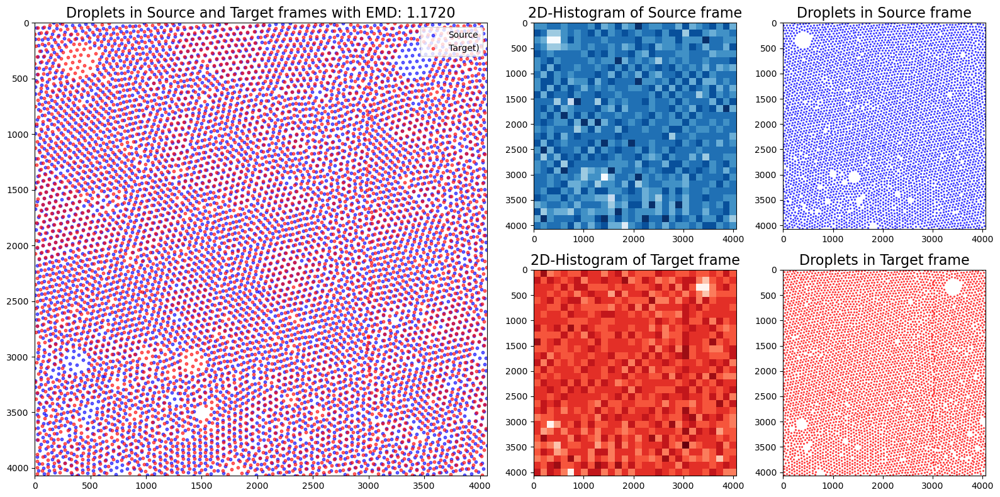

In [65]:
clip = 'Droplet_barcode_noMovement_Shift_3000pixelright'
EMD_Droplet_barcode_noMovement_Shift_3000pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_3000_dist = EMD_Droplet_barcode_noMovement_Shift_3000pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_3000pixelright.plot_emd()

#### 4000 pixel

Earth Mover's Distance with 30 bins:
Mean: 0.399 (std: 0.000)
Median: 0.399



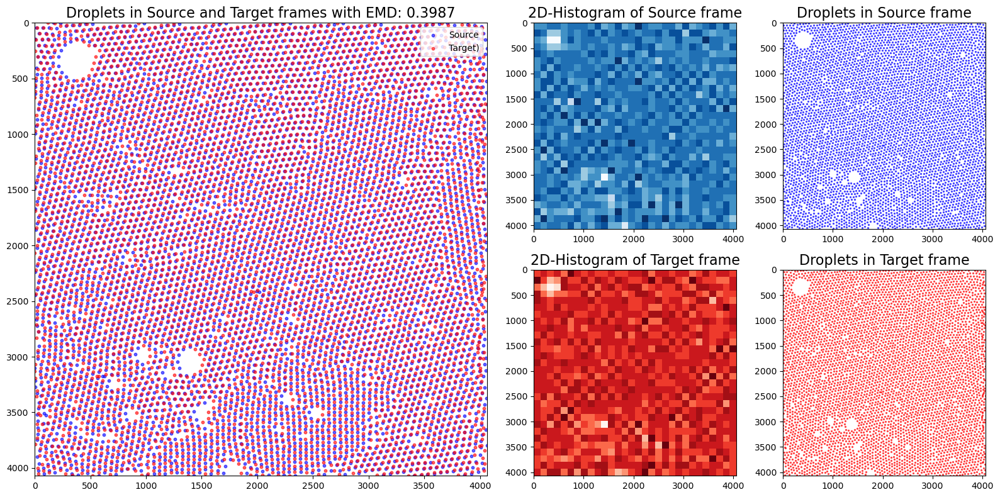

In [66]:
clip = 'Droplet_barcode_noMovement_Shift_4000pixelright'
EMD_Droplet_barcode_noMovement_Shift_4000pixelright = EMD_Movement(Path(Path('data/03_features') / Path(clip) / 'droplets_y0_x0.csv'))

EMD_shift_4000_dist = EMD_Droplet_barcode_noMovement_Shift_4000pixelright.emd_()
EMD_Droplet_barcode_noMovement_Shift_4000pixelright.plot_emd()